<h1>
    <br style ="font-family:UCL-SoM-Outline;color:#EA7600"> GROUP COURSEWORK </br> 
    </p>
</h1>

<h4>
<p style="font-size:18pt">Predictive Analytics</p>

</h4>



## Student Names: 
                  
### Wenhao Jiao

### Pavlos Michaelides

### Symeon Kokovidis

### Katharina Wiedmann

### Andreas Mourou
    
### Tammy Michaeli



# About this Notebook: 
This notebook contains the code that has been used to create the final report. The presentantion of the results of this notebook can be found in the document "Predictive Analytics Group Project.pdf" . In the "Spotipy" folder we have a notebook that collects data from the Spotipy API. The collected data are used in this notebook. In the same fashion, in "Map" folder we have devoleped a geographical representantion (map) of the streamers across the UK. The final product has been included in this notebook.

Regarding data files: The main files with streams of the Spotify Users (1.2GB) is not available to the public. For the rest data files we have mentioned their source where is possible.

In [1]:
# Preamble 
# Import all required libraries
#import sherlockml.filesystem as sfs
import pandas as pd
import random
 
#Libraries
from matplotlib import pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib import pyplot
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV #hyperparameter tuning
from sklearn.preprocessing import StandardScaler, MinMaxScaler, FunctionTransformer #convert a function to a transformer - this will be used in our scikit-pipeline
from sklearn import decomposition
from collections import Counter
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, auc, precision_recall_curve, recall_score, roc_curve, roc_auc_score, classification_report, confusion_matrix
from sklearn.decomposition import KernelPCA
import confusion_matrix_pretty_print as ppcm
import timeit #calculate execution time 

##Options
###IPython
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
%autosave 30

###Pandas
####Show all columns from a pd.DataFrame
pd.set_option('display.max_columns', 500)
####Set scientific notation of results to standard (decimal)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

#Ignore warnings
import warnings
warnings.filterwarnings("ignore")

Autosaving every 30 seconds


# 1.0 Load the data and define the problem

In [2]:
# Read in sampled data
data = pd.read_csv('./cleaned_data.csv') ### about low_memory=False ; increases loading time but can determine better the dtypes of columns
print('rows:',len(data))

rows: 3805499


In [3]:
snd_sub = pd.read_csv('./Second-level subdivisions.csv', index_col=False)
snd_sub = snd_sub.iloc[:,0:2]
data = data.merge(snd_sub, left_on='region_code' , right_on='Code', how='left', suffixes=('', '')) 
#suffixes=('', '') is used to avoid creating new columns with suffixes when re-executing code

In [4]:
#needs to avoid using the extenral .csv file (vanilla solution to extract playlist...)
playlist_ids_and_titles = pd.read_csv('./playlists_ids_and_titles.csv',encoding = 'latin-1',error_bad_lines=False,warn_bad_lines=False)
playlist_mapper = playlist_ids_and_titles[playlist_ids_and_titles.id.str.len()==22].drop_duplicates(['id'])
data['playlist_name'] = data.stream_source_uri.astype(str).str[-22:].map(playlist_mapper.set_index('id')['name'])
data['playlist_name'].value_counts().sort_values(ascending=False)

Hot Hits UK                                                   193654
Today's Top Hits                                              105383
Topsify UK Top 40                                              54982
Freshness: Hot House Music                                     32961
The Pop List                                                   28630
                                                               ...  
Pop Hits??????                                                     1
Deep/Tech/Future - House? 2017 *UPDATED*                           1
Runing list                                                        1
Sexy Playlist                                                      1
Dubstep - Reggae - Trap - Rap - Chill - Moombahton - Mixed         1
Name: playlist_name, Length: 7102, dtype: int64

In [5]:
# Keep a copy of original data in case of changes made to dataframe
all_artists = data.copy()

<div class="alert alert-success">
<b> 3.1 Forming our predictive problem</b> 

<p>For our predictive problem we've decided to not deal with any artist who became succesful (i.e. featured on top 4 key playlists) in years 2014 to 2016 (red shaded area in the graph). In addition, we've selected to keep the information of who became succesful in 2017 while removing any transcactions from this year.
The concept here is that based on transcactions from 2014 to 2016 we are trying to predict who became succesful in 2017 (yellow shaded area in the graph). <br> <br>
    
In the next code blocks, we create labels of who became succesful in 2017 as well as who became succesful in years 2014-2016. Based on these labels we subset our initial dataset.</p>
    
</div>

![Problem Formation](problem_formation.png)

In [6]:
data = all_artists.copy()

In [7]:
# 4 key Playlists
top_4 = ["Hot Hits UK", "Massive Dance Hits" , "The Indie List" , "New Music Friday"]
# select relevant playlists 
top4_filter = data.playlist_name.isin(top_4)

In [8]:
# Define Dependent Variable
def get_successful_artists(DF, key_filter):
    assert isinstance(DF, pd.core.frame.DataFrame), 'Argument must be a pandas DataFrame'
    if not isinstance(DF['DateTime'].dtype, np.datetime64): 
        DF['DateTime'] = pd.to_datetime(DF.DateTime)
    return DF.loc[((key_filter) & (DF.DateTime >= pd.Timestamp(2017,1,1)) ), 'artist_name' ].unique()

# Create label in DF which shows if an artist featured in top 4 playlists in 2017
def create_successful_artists_labels(DF, key_filter): #it is not a global function - it assumes that success_2017 it's the response
    #returns the name of artists that they featured in top 4 at any time in 2017
    DF['success_2017'] = 0
    #featured_artists_2017 = DF.loc[((key_filter) & (DF.DateTime >= pd.Timestamp(2017,1,1)) ), 'artist_name' ].unique()
    DF.loc[data.artist_name.isin(get_successful_artists(DF, key_filter)), 'success_2017']=1
    return DF  

def get_successful_before_2017(DF, key_filter):
    assert isinstance(DF, pd.core.frame.DataFrame), 'Argument must be a pandas DataFrame'
    if not isinstance(DF['DateTime'].dtype, np.datetime64): 
        DF['DateTime'] = pd.to_datetime(DF.DateTime) 
    return DF.loc[((key_filter) & ( DF.DateTime <= pd.Timestamp(2016,12,31)) ), 'artist_name' ].unique()

# Create label in DF which shows if an artist featured in top 4 playlists before 2017 (2014-2016)
def create_successful_before_2017_labels(DF, key_filter): #it is not a global function - it assumes that success_2017 it's the response
    #returns the name of artists that they featured in top 4 at any time before 2017
    DF['success_before_2017'] = 0
    DF.loc[DF.artist_name.isin(get_successful_before_2017(DF, key_filter)), 'success_before_2017'] = 1
    return DF 


In [9]:
# Call the functions above
data_labelled = create_successful_artists_labels(data, top4_filter)
data_labelled = create_successful_before_2017_labels(data_labelled, top4_filter)

In [10]:
# Here we get a summary of the artists who were succesful in different years
def summary_art(DF):
    assert isinstance(DF, pd.core.frame.DataFrame), 'Argument must be a pandas DataFrame'
    summary_art = DF.groupby(['success_before_2017', 'success_2017']).agg({"artist_name": pd.Series.nunique})
    print("Total artists in this dataset:" , summary_art.artist_name.sum(), 'artists')
    return summary_art

summary_art(data_labelled)

Total artists in this dataset: 661 artists


artist_name
success_before_2017 success_2017             
0                   0                     578
                    1                      55
1                   0                       9
                    1                      19

In [11]:
# Remove all artists and their transcations who were succesful before 2017
def remove_success_before_2017 (DF, artist_filter):
    assert isinstance(DF, pd.core.frame.DataFrame), 'Argument must be a pandas DataFrame'
    assert isinstance(artist_filter, (pd.core.series.Series, list) ), 'Argument must be a list or a pandas Series'
    
    return DF[~DF.artist_name.isin(get_successful_before_2017(DF, artist_filter))]

# remove all transcactions of 2017
def remove_transactions_2017 (trans_DF):
    assert isinstance(trans_DF, pd.core.frame.DataFrame), 'First argument must be a pandas DataFrame'
    assert 'customer_id' in trans_DF.columns, 'First DataFrame must have transactional Data'
    return trans_DF.loc[trans_DF.year != 2017]


# Summarise manipulations
def create_trans_table_v1(DF, artist_filter):
    assert isinstance(DF, pd.core.frame.DataFrame), 'Argument must be a pandas DataFrame'
    assert isinstance(artist_filter, (pd.core.series.Series, list) ), 'Argument must be a list or a pandas Series'
    trans_DF = remove_success_before_2017(data, top4_filter)
    return remove_transactions_2017(trans_DF)

trans_pred = create_trans_table_v1(data_labelled, top4_filter)

In [12]:
# get summary statistics
summary_art(trans_pred)

Total artists in this dataset: 338 artists


artist_name
success_before_2017 success_2017             
0                   0                     308
                    1                      30

<div class="alert alert-success">
<b> 3.2 Keeping response in seperate DataFrame</b> 

<p>In this stage we extract from the transactional data who became succesful in 2017. We are not going to use anywhere this table in our next steps (i.e. feature engineering) as we do not want our features to be biased towards the response.</p> 
    
</div>

In [13]:
# Function to get the response column
def get_resp_v1(original_data, play_filter):
    assert isinstance(original_data, pd.core.frame.DataFrame), 'Argument must be a pandas DataFrame'
    data_labelled = create_successful_artists_labels(original_data, play_filter)
    data_labelled = create_successful_before_2017_labels(data_labelled, play_filter)
    trans_DF = create_trans_table_v1(data_labelled, play_filter)
    
    drop_duplic = trans_DF[['artist_name','success_2017']].drop_duplicates()
    drop_duplic.set_index('artist_name', inplace=True)
    return drop_duplic

resp_pred = get_resp_v1(data, top4_filter)
resp_pred

,success_2017
artist_name,
Sturgill Simpson,0
Delafe,0
Willy William,0
Benjamin Beilman,0
Topic,1
...,...
Terror Jr,1
The War On Drugs,1
THEY.,1


Now that we have created our dependent variable – whether an artist is successful or not, we can look at generating a set of features, based on the columns within our dataset, that we think might best explain the reasons for this success. 

<div class="alert alert-success">
<b> 3.3 Remove redundant columns</b> 

<p>Below we calculate the percentage of missing values per column in the transactional data. Next, we remove all these columns that have 100% missing values, columns that have a single value only as well as other columns which we are not going to use further. Finally, we drop any label of successfulness that we have created before.</p> 
    
</div>

In [14]:
# Function to get the percentage of missing values for each column
def missing_pct(DF):
    assert isinstance(DF, pd.core.frame.DataFrame), 'Argument must be a pandas DataFrame'
    missing = DF.isnull().sum()/len(trans_pred)*100  #find the percentage of nan cells per column
    return missing[missing>0].sort_values(ascending=False) 

missing_pct(trans_pred) #used to specify which to remove on drop_redundant(DF)

source              100.000
stream_cached       100.000
offline_timestamp   100.000
referral_code       100.000
partner_name         89.926
playlist_name        72.487
playlist_id          70.387
stream_source_uri    70.387
financial_product    62.502
Area Name            10.176
Code                 10.176
region_code           9.446
postal_code           5.773
gender                1.178
user_product_type     0.773
birth_year            0.328
isrc                  0.001
dtype: float64

In [15]:
# Function to drop redundant columns
def drop_redundant(DF):
    assert isinstance(DF, pd.core.frame.DataFrame), 'Argument must be a pandas DataFrame'
    check_to_remove_columns = [
        'Unnamed: 0','Unnamed: 0.1','Unnamed: 0.1.1','day',
        'log_time', 'upc', 'filename', 'source', 'stream_cached', 'offline_timestamp',
        'referral_code' , 'track_uri'
        
        #'Unnamed: 0','Unnamed: 0.1','Unnamed: 0.1.1' , different value per row
        #'day':single value in all column
        #'log_time' has been splitted to new columns ('DateTime', 'hour', 'minute', 'week', 'month', 'year', 'date')
        # 'upc' known also as Universal Product Code , we won't use it in our analysis
        # 'filename' we won't use it in our analysis
        # 'source', 'stream_cached', 'offline_timestamp', 'referral_code' : 100% missing values
        # 'track_uri' : only 3rd and 5th subset contain different values. The 3rd it's actually the playlist_name column
    ]

    return DF.drop(check_to_remove_columns, axis = 1, errors='ignore') #errors='ignore' suppress error and only existing labels are dropped. (so we don't need to check if a column already exists in the DF)

# Function to drop the responses
def drop_responses(DF):
    assert isinstance(DF, pd.core.frame.DataFrame), 'Argument must be a pandas DataFrame'
    check_to_remove_columns = ['success_2017', 'success_before_2017']
    return DF.drop(check_to_remove_columns, axis = 1, errors='ignore') #errors='ignore' suppress error and only existing labels are dropped. (so we don't need to check if a column already exists in the DF

In [16]:
# Call functions to create final transactional dataset
trans_pred = drop_redundant(trans_pred)
trans_pred = drop_responses(trans_pred)
trans_pred.columns

Index(['mobile', 'track_id', 'isrc', 'artist_name', 'track_name', 'album_name',
       'customer_id', 'postal_code', 'access', 'country_code', 'gender',
       'birth_year', 'region_code', 'partner_name', 'financial_product',
       'user_product_type', 'stream_length', 'stream_source',
       'stream_source_uri', 'stream_device', 'stream_os', 'track_artists',
       'DateTime', 'hour', 'minute', 'week', 'month', 'year', 'date',
       'weekday', 'weekday_name', 'playlist_id', 'playlist_name', 'Code',
       'Area Name'],
      dtype='object')

<div class="alert alert-success">
<b> 3.4 Initiate the Feature DataFrame</b> 

<p>Below we create an empty DataFrame which has as index the artist_name. This DataFrame will be used to store any of the features that we are going to create in the next steps.</p> 
    
</div>

In [17]:
# Function to get the artist names as index
def get_artist_indexed_dataframe(DF):
    assert isinstance(DF, pd.core.frame.DataFrame), 'Argument must be a pandas DataFrame'
    art_df = pd.DataFrame(DF.artist_name.unique())
    art_df.columns = ['artist_name']
    art_df= art_df.set_index('artist_name')
    return art_df

feat_pred = get_artist_indexed_dataframe(trans_pred)
feat_pred.head()

""
artist_name
Sturgill Simpson
Delafe
Willy William
Benjamin Beilman
Topic


<div class="alert alert-success">
<b> 4.2 Re-defining our Data Problem</b> 

<p> By re-assesing our predictive problem which was defined in the "3.1 Forming our predictive problem" we realised that our features were based on transactions until the end of 2016. On the other hand, our response was defined as the succesful artists of all 2017. We believe that having transactions that are timely really close to the actual response can actually bias our predictive model and lead to very accurate predictions. For this reason we decided to remove all the transactions of the last three months of 2016. This actually creates a 3-month period window between our historical data and the response.
    
Please note that by removing these transactions we have also removed 56 artists who started to stream in the last three months of 2016. Five out of them were actually succesful in 2017.
    
Below we perform the pipeline that was defined in the part "3.13 A pipeline for Week 5" which encaptures all of the steps that we went through so far. The only difference here is that we remove the transactions of the last three months. This section, as well as the next two (4.3, 4.4) will be used extensively to check different Machine Learning algorithms and settings (e.g. SMOTE against ADASYN for balancing the dataset).</p> 
    
</div>

![Problem Formation_v2](problem_formation_v2.png)

In [18]:
#Please note: Important changes in code are marked up with the following comment:
############
#----!-----#
############

####################################################################################################
#Transaction Table
#1. We create labels for succesful artists in 2014-2016 and succseful artists in 2017
#2. We remove all the artists and their transactions who were succesful in 2014-2016 (create_trans_table_v1)
#3. We keep the labels for artists who were succesful in 2017 (create_trans_table_v1)
#4. We manually remove all the transactions of the last three months of 2016 
    #(including artists who started streaming in these months)
####################################################################################################

#Select relevant playlists 
top4_filter = data.playlist_name.isin( ["Hot Hits UK", "Massive Dance Hits" , "The Indie List" , "New Music Friday"])

#Create success labels
data_labelled = create_successful_artists_labels(data, top4_filter)
data_labelled = create_successful_before_2017_labels(data_labelled, top4_filter)

#Create transactional table (v1: Drop transcations of succesful artists before 2017, drop all transcations of 2017)
trans_pred = create_trans_table_v1(data_labelled , top4_filter)

############
#----!-----#
############
#here we remove the transactions of the last three months
trans_pred = trans_pred.loc[~(((trans_pred.year==2016) &(trans_pred.month>10))) ] 

#sanity checks for artists who started to stream from 2016/10 
#minmax = trans_pred.groupby('artist_name').agg({"DateTime": ['min', 'max']}).reset_index(col_level=1)
#minmax.columns = minmax.columns.get_level_values(1)
#minmax['min'] = pd.to_datetime(minmax['min'])
#minmax['max'] = pd.to_datetime(minmax['max'])
#minmax.loc[(minmax['min'].dt.month>10) & (minmax['min'].dt.year==2016)].shape

############################################################################################################################################
# Response Table
#1. We use Transcaction Table to keep the responses
#2. We remove the success labels from the Transcaction Table
####################################################################################################
resp_pred = trans_pred[['artist_name','success_2017']].drop_duplicates()
resp_pred = resp_pred.set_index('artist_name')

summary_art(trans_pred)

#Remove redundant columns from trans_pred
trans_pred = drop_redundant(trans_pred)
trans_pred = drop_responses(trans_pred)


#AND CREATE FEAT PRED
feat_pred = get_artist_indexed_dataframe(trans_pred)


Total artists in this dataset: 282 artists


artist_name
success_before_2017 success_2017             
0                   0                     257
                    1                      25

In [19]:
trans_pred.head(2)
trans_pred.shape
feat_pred.head(2)
feat_pred.shape
resp_pred.head(2)
resp_pred.shape
resp_pred.success_2017.value_counts()

,mobile,track_id,isrc,artist_name,track_name,album_name,customer_id,postal_code,access,country_code,gender,birth_year,region_code,partner_name,financial_product,user_product_type,stream_length,stream_source,stream_source_uri,stream_device,stream_os,track_artists,DateTime,hour,minute,week,month,year,date,weekday,weekday_name,playlist_id,playlist_name,Code,Area Name
0,True,8f1924eab3804f308427c31d925c1b3f,USAT21600547,Sturgill Simpson,Call To Arms,A Sailor's Guide to Earth,6c022a8376c10aae37abb839eb7625fe,NE,free,GB,male,1968.000,GB-DUR,NaN,NaN,ad,277.000,album,NaN,mobile,Android,Sturgill Simpson,2016-05-10 12:15:00,12,15,19,5,2016,2016-05-10,1,Tuesday,NaN,NaN,GB-DUR,Durham County
1,True,8f1924eab3804f308427c31d925c1b3f,USAT21600547,Sturgill Simpson,Call To Arms,A Sailor's Guide to Earth,6c022a8376c10aae37abb839eb7625fe,NE,free,GB,male,1968.000,GB-DUR,NaN,NaN,ad,53.000,album,NaN,mobile,Android,Sturgill Simpson,2016-05-10 12:15:00,12,15,19,5,2016,2016-05-10,1,Tuesday,NaN,NaN,GB-DUR,Durham County


(197854, 35)

""
artist_name
Sturgill Simpson
Delafe


(282, 0)

,success_2017
artist_name,
Sturgill Simpson,0
Delafe,0


(282, 1)

0    257
1     25
Name: success_2017, dtype: int64

In [20]:
# Create list with successful artists in 2017
suc2017 = list(resp_pred.loc[resp_pred.success_2017==1].index)
suc2017

['Topic',
 'Lido',
 'Yellow Claw',
 'Dae Dae',
 'Ledinsky',
 'Niia',
 'MARC',
 'Sjowgren',
 'TRXD',
 'dvsn',
 'The Hunna',
 'Maggie Lindemann',
 'A R I Z O N A',
 'Basic Tape',
 'BETSY',
 'Coasts',
 'Creeper',
 'Neon Waltz',
 'RAT BOY',
 'Rationale',
 'Ten Tonnes',
 'Terror Jr',
 'The War On Drugs',
 'THEY.',
 'Zak Abel']

In [21]:
#SANITY CHECKS FOR FORMING THE TIME-FRAME OF THE DATASET
#RECREATE subset without removing transactions of 2017 (for creating Andreas' viz)

#Create transactional table (v1: Drop transcations of succesful artists before 2017, drop all transcations of 2017)

#----!-----#
############
#here we remove the transactions of the last three months
data_labelled_viz = data.loc[data.artist_name.isin(suc2017)]
data_labelled_viz = data_labelled_viz.loc[data_labelled_viz.playlist_name.isin(["Hot Hits UK", "Massive Dance Hits" , "The Indie List" , "New Music Friday"])]
#remove_transactions_2017(trans_DF)
#pd.Series(data_labelled_viz.date.unique()).sort_values(ascending=False)
data_labelled_viz.head(2)

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,day,log_time,mobile,track_id,isrc,upc,artist_name,track_name,album_name,customer_id,postal_code,access,country_code,gender,birth_year,filename,region_code,referral_code,partner_name,financial_product,user_product_type,offline_timestamp,stream_length,stream_cached,stream_source,stream_source_uri,stream_device,stream_os,track_uri,track_artists,source,DateTime,hour,minute,week,month,year,date,weekday,weekday_name,playlist_id,playlist_name,Code,Area Name,success_2017,success_before_2017
80780,80780,807809,"('small_artists_2017.csv', 47151)",10,20170110T07:45:00,True,41505f3d712a4977a311dc2d16b34066,USAT21603082,75679905703.000,Ledinsky,DonaldTrumpMakesMeWannaSmokeCrack - Landis Remix,DonaldTrumpMakesMeWannaSmokeCrack,9e954d6eca2a5b99006516877986651e,B7,premium,GB,male,1905.000,streams_20170110_GB.008.gz,GB-SHN,nan,NaN,NaN,paid,nan,102.000,nan,others_playlist,spotify:user:spotify_uk_:playlist:6FfOZSAN3N6u...,mobile,iOS,spotify:track:1Zfelpa2iR5uUXAHEHw4N8,Ledinsky,nan,2017-01-10 07:45:00,7,45,2,1,2017,2017-01-10,1,Tuesday,6FfOZSAN3N6u7v81uS7mxZ,Hot Hits UK,GB-SHN,St. Helens,1,0
102827,102827,1028279,"('small_artists_2017.csv', 267621)",10,20170110T18:15:00,True,5bedbbe2be374b98be26d70e330b23e5,DEA621600739,190295962227.000,Topic,Home (feat. Nico Santos) - Marcapasos Radio Remix,Home (feat. Nico Santos),099512dfdebf53ce7bdea181377bd64a,12,premium,GB,female,1990.000,streams_20170110_GB.000.gz,GB-CHE,nan,NaN,NaN,paid,nan,214.000,nan,others_playlist,spotify:user:spotify_uk_:playlist:6FfOZSAN3N6u...,mobile,iOS,spotify:track:2NsWGd3UslepVF25pKw1sp,Topic,nan,2017-01-10 18:15:00,18,15,2,1,2017,2017-01-10,1,Tuesday,6FfOZSAN3N6u7v81uS7mxZ,Hot Hits UK,GB-CHE,Cheshire East,1,0


In [22]:
#data_labelled_viz = data_labelled_viz.loc[~(((data_labelled_viz.year==2016) &(data_labelled_viz.month>10))) ].copy()
#data_labelled_viz = data_labelled_viz.loc[~(((data_labelled_viz.year<2017) )) ].copy()

#data_labelled_viz.head()
data_labelled_viz.artist_name.nunique()
data_labelled_viz.shape
#.groupby('date')['artist_name'].nunique()

25

(17111, 49)

In [23]:
#number of artists who streamed before 2017
#data.loc[data.year != pd.Timestamp(2017,1,1)].artist_name.nunique() 
#number of artists who streamed in 2017
#data.loc[data.year == pd.Timestamp(2017,1,1)].artist_name.nunique()
#date of first stream - date of last stream per artist
minmax = data_labelled_viz.groupby('artist_name').agg({"date": ['min', 'max']}).reset_index(col_level=1)
minmax.columns = minmax.columns.get_level_values(1)
minmax['min'] = pd.to_datetime(minmax['min'])
minmax['max'] = pd.to_datetime(minmax['max'])
minmax.head()
minmax.shape
#minmax.loc[(minmax['min'] < pd.Timestamp(2017,1,1)) & (minmax['max'] < pd.Timestamp(2017,1,1)) ].head(10)
#minmax.loc[(minmax['min'] < pd.Timestamp(2017,1,1) )].shape

,artist_name,min,max
0,A R I Z O N A,2017-02-10,2017-07-10
1,BETSY,2017-06-10,2017-06-10
2,Basic Tape,2017-03-10,2017-07-10
3,Coasts,2017-06-10,2017-06-10
4,Creeper,2017-07-10,2017-07-10


(25, 3)

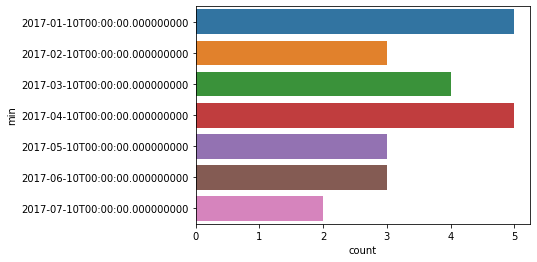

In [24]:
# Streamcounts for newly successful stream counts every month in 2017
sns.countplot(y="min", data=minmax)
plt.show();

In [25]:
# Filter key playlists
top4_filter = data.playlist_name.isin( ["Hot Hits UK", "Massive Dance Hits" , "The Indie List" , "New Music Friday"])

#Create success labels
data_labelled = create_successful_artists_labels(data, top4_filter)
data_labelled = create_successful_before_2017_labels(data_labelled, top4_filter)
data_labelled = data_labelled.loc[data_labelled.success_before_2017==0]
data_labelled = data_labelled.loc[data_labelled.success_2017==1]
data_labelled.artist_name.nunique()

minmax = data_labelled.groupby('artist_name').agg({"date": ['min', 'max']}).reset_index(col_level=1)
minmax.columns = minmax.columns.get_level_values(1)
minmax['min'] = pd.to_datetime(minmax['min'])
minmax['max'] = pd.to_datetime(minmax['max'])
#minmax.head()
minmax.shape

minmax = minmax.loc[minmax['min']<pd.Timestamp(2016,10,11)] #2016,10,11 because of the faulty subset in the initial code
minmax.head(40)
minmax.shape
last25 = list(minmax.artist_name)

55

(55, 3)

,artist_name,min,max
1,A R I Z O N A,2016-02-10,2017-07-10
5,BETSY,2016-08-10,2017-07-10
6,Basic Tape,2016-10-10,2017-07-10
10,Coasts,2014-06-10,2017-07-10
12,Creeper,2015-07-10,2017-07-10
13,Dae Dae,2016-04-10,2017-07-10
24,Ledinsky,2016-08-10,2017-07-10
25,Lido,2016-04-10,2017-07-10
26,MARC,2016-04-10,2017-07-10
27,Maggie Lindemann,2016-10-10,2017-07-10


(25, 3)

In [26]:
data_labelled4k = data_labelled.loc[data_labelled.playlist_name.isin(["Hot Hits UK", "Massive Dance Hits" , "The Indie List" , "New Music Friday"])]
data_labelled4k = data_labelled4k.loc[data_labelled4k.artist_name.isin(last25)]

minmax = data_labelled4k.groupby('artist_name').agg({"date": ['min', 'max']}).reset_index(col_level=1)
minmax.columns = minmax.columns.get_level_values(1)
minmax['min'] = pd.to_datetime(minmax['min'])
minmax['max'] = pd.to_datetime(minmax['max'])
minmax.head()
minmax.shape

,artist_name,min,max
0,A R I Z O N A,2017-02-10,2017-07-10
1,BETSY,2017-06-10,2017-06-10
2,Basic Tape,2017-03-10,2017-07-10
3,Coasts,2017-06-10,2017-06-10
4,Creeper,2017-07-10,2017-07-10


(25, 3)

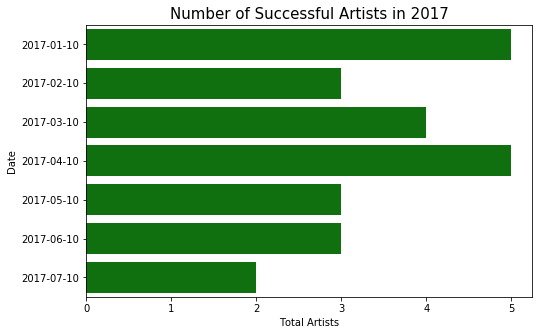

In [27]:
# Final visualisation of the newly successful artists in 2017 per month
minmax['min_title'] = minmax['min'].astype(str)
fig, ax = plt.subplots(figsize=(8,5))
g = sns.countplot(y="min_title",order = pd.Series(minmax.min_title.unique()).sort_values(), data=minmax, palette=["green"])
ax.set(xlabel='Total Artists', ylabel='Date')
ax.set_title("Number of Successful Artists in 2017", fontsize=15);

In [28]:
# Check unique playlists per artist
trans_pred.groupby("artist_name")["playlist_name"].nunique()

artist_name
99 Percent                 12
A Boogie Wit Da Hoodie     20
A R I Z O N A             113
AGWA                        1
ALMA                        0
                         ... 
Zac Brown                   2
Zak & Diego                 0
Zak Abel                   37
dvsn                       67
livetune+                   1
Name: playlist_name, Length: 282, dtype: int64

# 1. General information 

In [29]:
data = trans_pred

In [30]:
# Check first 5 rows of dataset
data.head()

,mobile,track_id,isrc,artist_name,track_name,album_name,customer_id,postal_code,access,country_code,gender,birth_year,region_code,partner_name,financial_product,user_product_type,stream_length,stream_source,stream_source_uri,stream_device,stream_os,track_artists,DateTime,hour,minute,week,month,year,date,weekday,weekday_name,playlist_id,playlist_name,Code,Area Name
0,True,8f1924eab3804f308427c31d925c1b3f,USAT21600547,Sturgill Simpson,Call To Arms,A Sailor's Guide to Earth,6c022a8376c10aae37abb839eb7625fe,NE,free,GB,male,1968.000,GB-DUR,NaN,NaN,ad,277.000,album,NaN,mobile,Android,Sturgill Simpson,2016-05-10 12:15:00,12,15,19,5,2016,2016-05-10,1,Tuesday,NaN,NaN,GB-DUR,Durham County
1,True,8f1924eab3804f308427c31d925c1b3f,USAT21600547,Sturgill Simpson,Call To Arms,A Sailor's Guide to Earth,6c022a8376c10aae37abb839eb7625fe,NE,free,GB,male,1968.000,GB-DUR,NaN,NaN,ad,53.000,album,NaN,mobile,Android,Sturgill Simpson,2016-05-10 12:15:00,12,15,19,5,2016,2016-05-10,1,Tuesday,NaN,NaN,GB-DUR,Durham County
2,True,8f1924eab3804f308427c31d925c1b3f,USAT21600547,Sturgill Simpson,Call To Arms,A Sailor's Guide to Earth,352292382ff3ee0cfd3b73b94ea0ff8f,1,premium,GB,male,1995.000,GB-ESS,NaN,student,paid,326.000,collection,NaN,mobile,Android,Sturgill Simpson,2016-05-10 14:00:00,14,0,19,5,2016,2016-05-10,1,Tuesday,NaN,NaN,GB-ESS,Essex
3,True,8f1924eab3804f308427c31d925c1b3f,USAT21600547,Sturgill Simpson,Call To Arms,A Sailor's Guide to Earth,c3f2b54e76696ed491d9d8f964c97774,MK,premium,GB,male,1992.000,GB-HRT,NaN,student,paid,330.000,collection,NaN,tablet,iOS,Sturgill Simpson,2016-05-10 10:45:00,10,45,19,5,2016,2016-05-10,1,Tuesday,NaN,NaN,GB-HRT,Hertfordshire
4,True,8f1924eab3804f308427c31d925c1b3f,USAT21600547,Sturgill Simpson,Call To Arms,A Sailor's Guide to Earth,6a06a9bbe042c73e8f1a3596ec321636,KT,premium,GB,male,1979.000,GB-LND,NaN,NaN,paid,90.000,collection,NaN,mobile,iOS,Sturgill Simpson,2016-05-10 10:15:00,10,15,19,5,2016,2016-05-10,1,Tuesday,NaN,NaN,GB-LND,"London, City of"


In [31]:
# Check general information (data types, no. of columns, etc.)
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 197854 entries, 0 to 3540973
Data columns (total 35 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   mobile             197854 non-null  bool          
 1   track_id           197854 non-null  object        
 2   isrc               197851 non-null  object        
 3   artist_name        197854 non-null  object        
 4   track_name         197854 non-null  object        
 5   album_name         197854 non-null  object        
 6   customer_id        197854 non-null  object        
 7   postal_code        186687 non-null  object        
 8   access             197854 non-null  object        
 9   country_code       197854 non-null  object        
 10  gender             195384 non-null  object        
 11  birth_year         197116 non-null  float64       
 12  region_code        175396 non-null  object        
 13  partner_name       19894 non-null   object 

In [32]:
# Check missing values of each attribute
data.isnull().sum()

mobile                    0
track_id                  0
isrc                      3
artist_name               0
track_name                0
album_name                0
customer_id               0
postal_code           11167
access                    0
country_code              0
gender                 2470
birth_year              738
region_code           22458
partner_name         177960
financial_product    126817
user_product_type      2138
stream_length             0
stream_source             0
stream_source_uri    139421
stream_device             0
stream_os                 0
track_artists             0
DateTime                  0
hour                      0
minute                    0
week                      0
month                     0
year                      0
date                      0
weekday                   0
weekday_name              0
playlist_id          139421
playlist_name        143792
Code                  23761
Area Name             23761
dtype: int64

In [33]:
# Get summary statistics for attributes
data.describe()

,birth_year,stream_length,hour,minute,week,month,year,weekday
count,197116.000,197854.000,197854.000,197854.000,197854.000,197854.000,197854.000,197854.000
mean,1989.108,188.322,13.678,22.578,28.652,7.241,2015.876,2.926
std,10.837,65.707,5.308,16.775,12.126,2.747,0.346,2.145
min,1892.000,30.000,0.000,0.000,1.000,1.000,2014.000,0.000
25%,1986.000,168.000,10.000,15.000,19.000,5.000,2016.000,1.000
50%,1992.000,193.000,14.000,30.000,32.000,8.000,2016.000,3.000
75%,1996.000,221.000,18.000,45.000,41.000,10.000,2016.000,5.000
max,2014.000,900.000,23.000,45.000,50.000,12.000,2016.000,6.000


In [34]:
data.shape

(197854, 35)

# 2.Exploratory part 

In [35]:
###########
#The response here shows that the artist has become succesful at any time in 2017 - as the response is merged with all of his/her streams 
##########
#For comparisons I will create one more dataframe which also includes whether the streams from 2014-2017 end up being successful in 2017 
comparison_df = pd.merge(data, resp_pred, left_on='track_artists', right_on='artist_name', how='left')
comparison_df.head()

,mobile,track_id,isrc,artist_name,track_name,album_name,customer_id,postal_code,access,country_code,gender,birth_year,region_code,partner_name,financial_product,user_product_type,stream_length,stream_source,stream_source_uri,stream_device,stream_os,track_artists,DateTime,hour,minute,week,month,year,date,weekday,weekday_name,playlist_id,playlist_name,Code,Area Name,success_2017
0,True,8f1924eab3804f308427c31d925c1b3f,USAT21600547,Sturgill Simpson,Call To Arms,A Sailor's Guide to Earth,6c022a8376c10aae37abb839eb7625fe,NE,free,GB,male,1968.000,GB-DUR,NaN,NaN,ad,277.000,album,NaN,mobile,Android,Sturgill Simpson,2016-05-10 12:15:00,12,15,19,5,2016,2016-05-10,1,Tuesday,NaN,NaN,GB-DUR,Durham County,0.000
1,True,8f1924eab3804f308427c31d925c1b3f,USAT21600547,Sturgill Simpson,Call To Arms,A Sailor's Guide to Earth,6c022a8376c10aae37abb839eb7625fe,NE,free,GB,male,1968.000,GB-DUR,NaN,NaN,ad,53.000,album,NaN,mobile,Android,Sturgill Simpson,2016-05-10 12:15:00,12,15,19,5,2016,2016-05-10,1,Tuesday,NaN,NaN,GB-DUR,Durham County,0.000
2,True,8f1924eab3804f308427c31d925c1b3f,USAT21600547,Sturgill Simpson,Call To Arms,A Sailor's Guide to Earth,352292382ff3ee0cfd3b73b94ea0ff8f,1,premium,GB,male,1995.000,GB-ESS,NaN,student,paid,326.000,collection,NaN,mobile,Android,Sturgill Simpson,2016-05-10 14:00:00,14,0,19,5,2016,2016-05-10,1,Tuesday,NaN,NaN,GB-ESS,Essex,0.000
3,True,8f1924eab3804f308427c31d925c1b3f,USAT21600547,Sturgill Simpson,Call To Arms,A Sailor's Guide to Earth,c3f2b54e76696ed491d9d8f964c97774,MK,premium,GB,male,1992.000,GB-HRT,NaN,student,paid,330.000,collection,NaN,tablet,iOS,Sturgill Simpson,2016-05-10 10:45:00,10,45,19,5,2016,2016-05-10,1,Tuesday,NaN,NaN,GB-HRT,Hertfordshire,0.000
4,True,8f1924eab3804f308427c31d925c1b3f,USAT21600547,Sturgill Simpson,Call To Arms,A Sailor's Guide to Earth,6a06a9bbe042c73e8f1a3596ec321636,KT,premium,GB,male,1979.000,GB-LND,NaN,NaN,paid,90.000,collection,NaN,mobile,iOS,Sturgill Simpson,2016-05-10 10:15:00,10,15,19,5,2016,2016-05-10,1,Tuesday,NaN,NaN,GB-LND,"London, City of",0.000


In [36]:
# Setting the right response
successful_in_2017 = comparison_df[comparison_df['success_2017'] ==1]
unsuccessful_in_2017 = comparison_df[comparison_df['success_2017'] ==0]

## 2.1. Exploring Streams : Date, Hour and Stream Length

### a) Date 

         date  count
0  2014-06-10     58
1  2014-10-10     11
2  2014-11-10    182
3  2014-12-10    648
4  2015-01-10    291
5  2015-02-10    322
6  2015-03-10    510
7  2015-04-10    428
8  2015-05-10    430
9  2015-06-10    482
10 2015-07-10    501
11 2015-08-10    669
12 2015-09-10   2766
13 2015-10-10   2543
14 2015-11-10   2894
15 2015-12-10   2552
16 2016-01-10   2930
17 2016-02-10   6062
18 2016-03-10   6528
19 2016-04-10   7593
20 2016-05-10   8066
21 2016-06-10   8138
22 2016-07-10   7906
23 2016-08-10  10392
24 2016-09-10  16663
25 2016-10-10  22655


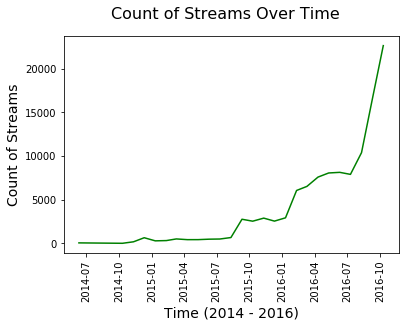

In [37]:
# DATE
# Transform date attribute to be of type datetime
successful_in_2017.loc[:,"date"] = pd.to_datetime(successful_in_2017.date)

#Sort by date
data = successful_in_2017.sort_values(by = "date")

# Create a dataframe with all the dates and the count of streams for each date
datecount = pd.DataFrame(data.groupby("date").size(), columns = ["count"]).reset_index()
print(datecount)
x = datecount.loc[:,"date"]
y = datecount.loc[:,"count"]

# Plot the number of streams changing over time
plt.plot(x,y, color='green')
plt.xticks(rotation='vertical');
plt.suptitle('Count of Streams Over Time', fontsize=16);
plt.xlabel('Time (2014 - 2016)', fontsize=14);
plt.ylabel('Count of Streams', fontsize=14);
plt.show();

         date  count
0  2014-06-10     25
1  2014-07-10     28
2  2014-08-10     14
3  2014-09-10     20
4  2014-10-10     27
5  2014-11-10     16
6  2014-12-10     27
7  2015-01-10     47
8  2015-02-10    214
9  2015-03-10    284
10 2015-04-10    286
11 2015-05-10    342
12 2015-06-10    597
13 2015-07-10    388
14 2015-08-10    610
15 2015-09-10    622
16 2015-10-10   1014
17 2015-11-10   1936
18 2015-12-10   1117
19 2016-01-10   1173
20 2016-02-10   3078
21 2016-03-10   4058
22 2016-04-10   3550
23 2016-05-10   6381
24 2016-06-10   9767
25 2016-07-10   7170
26 2016-08-10  12979
27 2016-09-10  11983
28 2016-10-10  13968


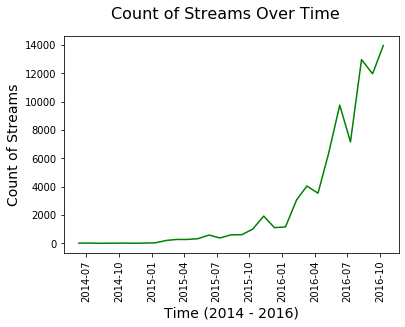

In [38]:
# DATE
# Transform date attribute to be of type datetime
unsuccessful_in_2017.loc[:,"date"] = pd.to_datetime(unsuccessful_in_2017.date)

#Sort by date
data = unsuccessful_in_2017.sort_values(by = "date")

# Create a dataframe with all the dates and the count of streams for each date
datecount = pd.DataFrame(data.groupby("date").size(), columns = ["count"]).reset_index()
print(datecount)
x = datecount.loc[:,"date"]
y = datecount.loc[:,"count"]

# Plot the number of streams changing over time
plt.plot(x,y, color='green')
plt.xticks(rotation='vertical');
plt.suptitle('Count of Streams Over Time', fontsize=16);
plt.xlabel('Time (2014 - 2016)', fontsize=14);
plt.ylabel('Count of Streams', fontsize=14);
plt.show();

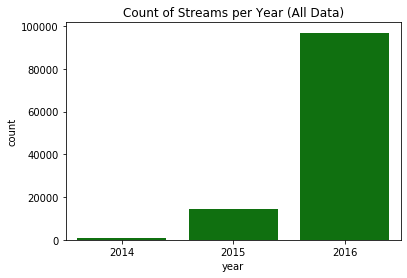

In [39]:
# Plot number of streams per year
sns.countplot(x="year", data=successful_in_2017, palette=["green"]).set_title("Count of Streams per Year (All Data)");

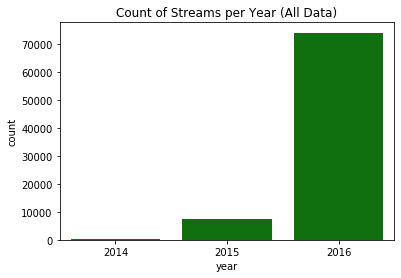

In [40]:
# Plot number of streams per year
sns.countplot(x="year", data=unsuccessful_in_2017, palette=["green"]).set_title("Count of Streams per Year (All Data)");

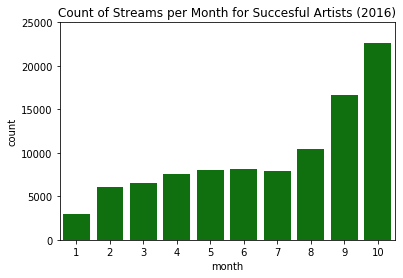

In [41]:
# Streams per month - successful
fig, ax = pyplot.subplots()
sns.countplot(x="month", data=successful_in_2017.loc[successful_in_2017.year==2016], palette=["green"]).set_title("Count of Streams per Month for Succesful Artists (2016)")
ax.set(ylim=(0, 25000));

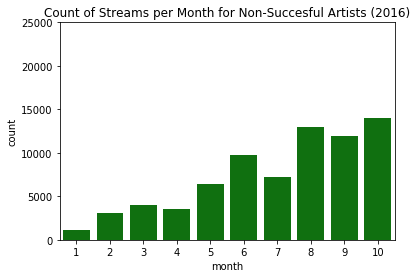

In [42]:
# Streams per month - unsuccessful
fig, ax = pyplot.subplots()
sns.countplot(x="month", data=unsuccessful_in_2017.loc[unsuccessful_in_2017.year==2016], palette=["green"]).set_title("Count of Streams per Month for Non-Succesful Artists (2016)")
ax.set(ylim=(0, 25000));

### b) Hour

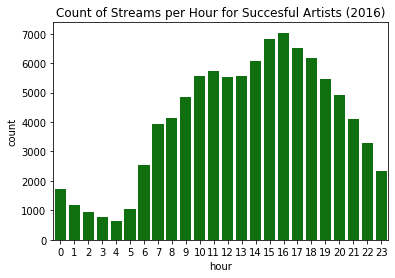

In [43]:
# Streams per Hour of Day
sns.countplot(x="hour", data=successful_in_2017.loc[successful_in_2017.year==2016], palette=["green"]).set_title("Count of Streams per Hour for Succesful Artists (2016)");

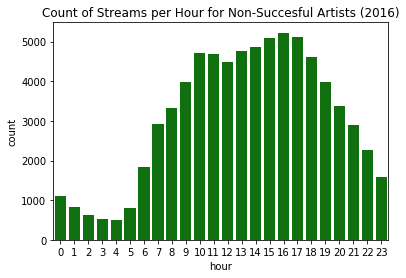

In [44]:
# Streams per Hour of Day
sns.countplot(x="hour", data=unsuccessful_in_2017.loc[unsuccessful_in_2017.year==2016], palette=["green"]).set_title("Count of Streams per Hour for Non-Succesful Artists (2016)");

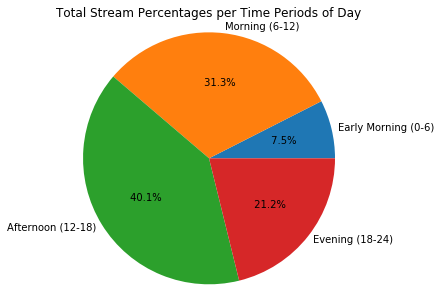

In [45]:
# Binarize Hour to create a categorical variable that contains time periods of a day
# Declare bin ranges and names
bin_ranges = [0, 6, 12, 18, 24]
bin_names = ['Early Morning (0-6)', 'Morning (6-12)', 'Afternoon (12-18)', 'Evening (18-24)']

# Create bins using cut
successful_in_2017['hour_bins'] = pd.cut(np.array(successful_in_2017['hour']),
                               bins=bin_ranges, labels=bin_names)

# Plot pie chart showing percentages for each  time range
pie_data = successful_in_2017.loc[successful_in_2017.year==2016].hour_bins.value_counts().sort_index()
label_list = pie_data.index
sizes = pie_data
fig1, ax1 = plt.subplots(figsize=(5, 5))
ax1.pie(
    sizes, labels = label_list, autopct =' %1.1f%%',
    pctdistance = 0.6, labeldistance = 1.05, shadow = False, startangle = 0,
    )
ax1.axis('equal') 
ax1.set_title('Total Stream Percentages per Time Periods of Day')
plt.show();

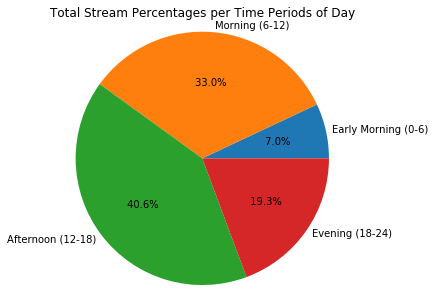

In [46]:
# Binarize Hour to create a categorical variable that contains time periods of a day
# Declare bin ranges and names
bin_ranges = [0, 6, 12, 18, 24]
bin_names = ['Early Morning (0-6)', 'Morning (6-12)', 'Afternoon (12-18)', 'Evening (18-24)']

# Create bins using cut
unsuccessful_in_2017['hour_bins'] = pd.cut(np.array(unsuccessful_in_2017['hour']),
                               bins=bin_ranges, labels=bin_names)

# Plot pie chart showing percentages for each  time range
pie_data = unsuccessful_in_2017.loc[unsuccessful_in_2017.year==2016].hour_bins.value_counts().sort_index()
label_list = pie_data.index
sizes = pie_data
fig1, ax1 = plt.subplots(figsize=(5, 5))
ax1.pie(
    sizes, labels = label_list, autopct =' %1.1f%%',
    pctdistance = 0.6, labeldistance = 1.05, shadow = False, startangle = 0,
    )
ax1.axis('equal') 
ax1.set_title('Total Stream Percentages per Time Periods of Day')
plt.show();

### c) Stream Length

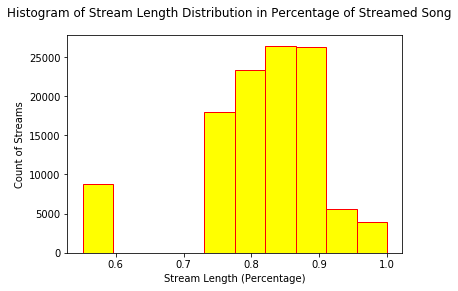

In [47]:
# Stream Length ratio for successful artists in 2017
temp = successful_in_2017.groupby(['artist_name', 'track_name'])['stream_length'].agg({'max' ,np.median})
temp['track_streamlength_ratio']=temp['median']/temp['max']
temp_art1=temp.groupby('artist_name')['median'].agg(np.median).to_frame('art_median_streamlength').reset_index()
temp_art2 = temp.reset_index().groupby('artist_name')['track_streamlength_ratio'].mean().to_frame('art_streamlength_ratio_mean').reset_index()
feat_temp = successful_in_2017.reset_index().copy()
feat_temp = successful_in_2017.merge(temp_art1, on='artist_name', how='left').merge(temp_art2, on='artist_name', how='left').set_index('artist_name')

plt.hist(feat_temp["art_streamlength_ratio_mean"], bins=10,edgecolor = "red", color='yellow')
plt.suptitle('Histogram of Stream Length Distribution in Percentage of Streamed Song')
plt.xlabel('Stream Length (Percentage)')
plt.ylabel('Count of Streams')
plt.show();

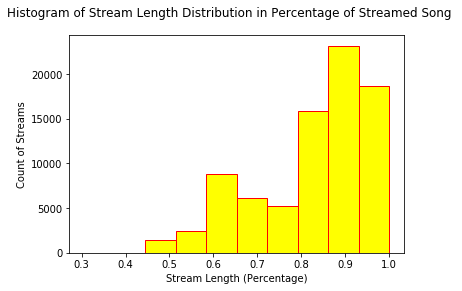

In [48]:
# Stream Length ratio of unsuccessful artists
temp = unsuccessful_in_2017.groupby(['artist_name', 'track_name'])['stream_length'].agg({'max' ,np.median})
temp['track_streamlength_ratio']=temp['median']/temp['max']
temp_art1=temp.groupby('artist_name')['median'].agg(np.median).to_frame('art_median_streamlength').reset_index()
temp_art2 = temp.reset_index().groupby('artist_name')['track_streamlength_ratio'].mean().to_frame('art_streamlength_ratio_mean').reset_index()

feat_temp = unsuccessful_in_2017.reset_index().copy()
feat_temp = unsuccessful_in_2017.merge(temp_art1, on='artist_name', how='left').merge(temp_art2, on='artist_name', how='left').set_index('artist_name')

plt.hist(feat_temp["art_streamlength_ratio_mean"], bins=10,edgecolor = "red", color='yellow')

plt.suptitle('Histogram of Stream Length Distribution in Percentage of Streamed Song ')
plt.xlabel('Stream Length (Percentage)')
plt.ylabel('Count of Streams')
plt.show();

<div class="alert alert-success">

<p>Next part to be discussed with team: We cannot see a skewness to the left for unsuccessful artists (as we had expected), therefore would leava out the comparison </p> 

## 2.2. Exploring Age & Gender

### a) Age

In [49]:
# Convert Birth Year into Age and get summary statistics
successful_in_2017["age"] = 2020 - successful_in_2017.birth_year

#Make sure it includes only ages < 100 
successful_in_2017 = successful_in_2017[successful_in_2017["age"] <= 100]

successful_in_2017["age"].describe()

count   111515.000
mean        29.179
std          9.319
min          6.000
25%         23.000
50%         26.000
75%         32.000
max        100.000
Name: age, dtype: float64

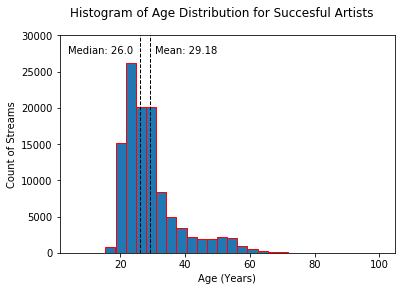

In [50]:
# Create Histogram for the distribution of Age
plt.hist(successful_in_2017["age"], bins=30,edgecolor = "red")

# Plot mean line and label
plt.axvline(successful_in_2017["age"].mean(), color='k', linestyle='dashed', linewidth=1)
min_ylim, max_ylim = plt.ylim()
plt.text(successful_in_2017["age"].mean()*1.05, max_ylim*1, "Mean: {}".format(round(successful_in_2017["age"].mean(),2)))

# Plot median line and label
plt.axvline(successful_in_2017["age"].median(), color='k', linestyle='dashed', linewidth=1)
min_ylim, max_ylim = plt.ylim()
plt.text(successful_in_2017["age"].median()* 0.15, max_ylim*1, "Median: {}".format(round(successful_in_2017["age"].median(),2)))
plt.suptitle('Histogram of Age Distribution for Succesful Artists')
plt.xlabel('Age (Years)')
plt.ylabel('Count of Streams')
plt.ylim([0,30000])
plt.show();

In [51]:
# Convert Birth Year into Age and get summary statistics
unsuccessful_in_2017["age"] = 2020 - unsuccessful_in_2017.birth_year

#Make sure it includes only ages < 100 
unsuccessful_in_2017 = unsuccessful_in_2017[unsuccessful_in_2017["age"] <= 100]

unsuccessful_in_2017["age"].describe()

count   81212.000
mean       32.772
std        10.562
min        14.000
25%        25.000
50%        30.000
75%        37.000
max       100.000
Name: age, dtype: float64

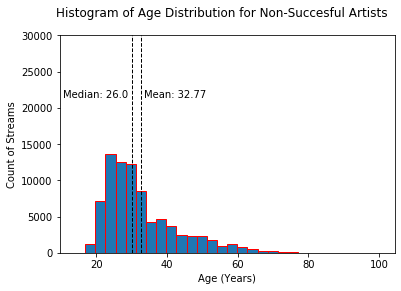

In [52]:
# Create Histogram for the distribution of Age
plt.hist(unsuccessful_in_2017["age"], bins=30,edgecolor = "red")

# Plot mean line and label
plt.axvline(unsuccessful_in_2017["age"].mean(), color='k', linestyle='dashed', linewidth=1)
min_ylim, max_ylim = plt.ylim()
plt.text(unsuccessful_in_2017["age"].mean()*1.02, max_ylim*1.5, "Mean: {}".format(round(unsuccessful_in_2017["age"].mean(),2)))

# Plot median line and label
plt.axvline(unsuccessful_in_2017["age"].median(), color='k', linestyle='dashed', linewidth=1)
min_ylim, max_ylim = plt.ylim()
plt.text(unsuccessful_in_2017["age"].median()* 0.35, max_ylim*1.5, "Median: {}".format(round(successful_in_2017["age"].median(),2)))
plt.suptitle('Histogram of Age Distribution for Non-Succesful Artists')
plt.xlabel('Age (Years)')
plt.ylabel('Count of Streams')
plt.ylim([0,30000])

plt.show();

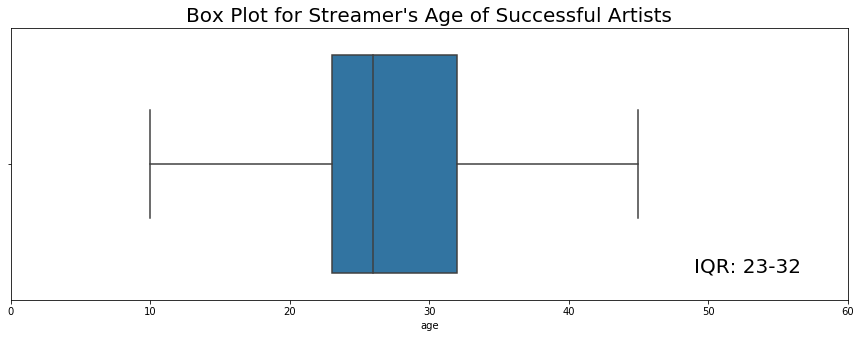

In [53]:
# Create boxplot for age (Successful)
# Calculate IQR to add it in figure
q25 = successful_in_2017['age'].quantile(.25)
q75 = successful_in_2017['age'].quantile(.75)
text = 'IQR: ' + str(int(q25)) + '-' + str(int(q75))

# Plot Boxplot
fig, ax = pyplot.subplots(figsize=(15,5))
g = sns.boxplot('age', data= successful_in_2017, showfliers=False)
g.text(49, 0.4,text, fontsize=20)
ax.set_title("Box Plot for Streamer's Age of Successful Artists", fontsize=20)
ax.set(xlim=(0, 60))
fig.show();

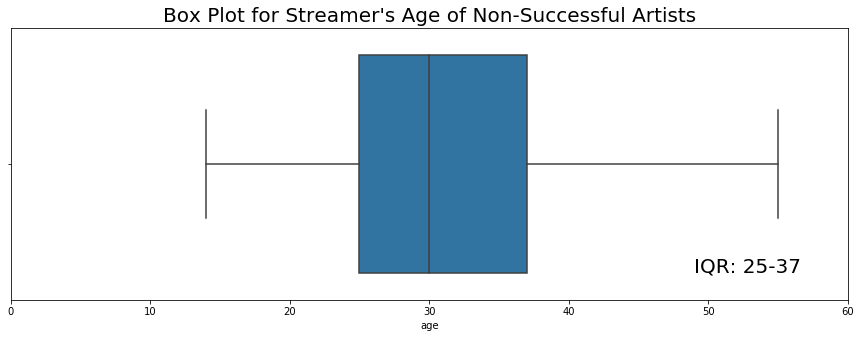

In [54]:
# Create boxplot for age (Unsuccessful)
# Calculate IQR to add it in figure
q25 = unsuccessful_in_2017['age'].quantile(.25)
q75 = unsuccessful_in_2017['age'].quantile(.75)
text = 'IQR: ' + str(int(q25)) + '-' + str(int(q75))

# Plot Boxplot
fig, ax = pyplot.subplots(figsize=(15,5))
g = sns.boxplot('age', data= unsuccessful_in_2017, showfliers=False)
g.text(49, 0.4,text, fontsize=20)
ax.set_title("Box Plot for Streamer's Age of Non-Successful Artists", fontsize=20)
ax.set(xlim=(0, 60))    
fig.show();


In [55]:
# Binarize Age to create a categorical variable that contains age groups
# Outliers are excluded from bins
# Declare bins ranges and names
bin_ranges = [15, 20, 25, 30, 35, 40, 50, 60, 75, 99]
bin_names = ["15-20", '20-25', '25-30', '30-35', '35-40', '40-50', '50-60',"60-75" , "75-99"]

# Use cut to make bins
successful_in_2017['Age Bin'] = pd.cut(np.array(successful_in_2017['age']),
                               bins=bin_ranges, labels=bin_names)

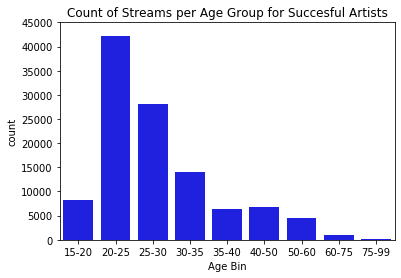

In [56]:
# Visualise Count of streams per age group
# Streams per month
fig, ax = pyplot.subplots()

sns.countplot(x="Age Bin", data=successful_in_2017, palette=["blue"]).set_title("Count of Streams per Age Group for Succesful Artists")
ax.set(ylim=(0, 45000));



In [57]:
# Binarize Age to create a categorical variable that contains age groups
# Outliers are excluded from bins
# Declare bins ranges and names
bin_ranges = [15, 20, 25, 30, 35, 40, 50, 60, 75, 99]
bin_names = ["15-20", '20-25', '25-30', '30-35', '35-40', '40-50', '50-60',"60-75", "75-99"]

# Use cut to make bins
unsuccessful_in_2017['Age Bin'] = pd.cut(np.array(unsuccessful_in_2017['age']),
                               bins=bin_ranges, labels=bin_names)

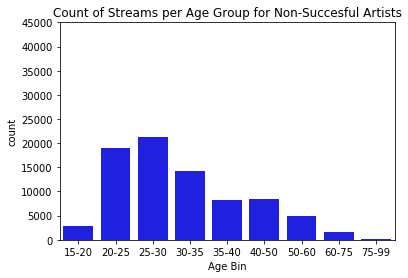

In [58]:
fig, ax = pyplot.subplots()
sns.countplot(x="Age Bin", data=unsuccessful_in_2017, palette=["blue"]).set_title("Count of Streams per Age Group for Non-Succesful Artists")
ax.set(ylim=(0, 45000));

### b) Gender

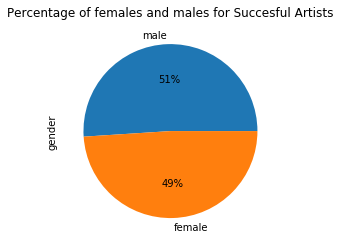

In [59]:
# Plot Male and Female Listeners for all data and key playlists
successful_in_2017['gender'].value_counts().plot.pie(autopct='%1.0f%%').set_title('Percentage of females and males for Succesful Artists');

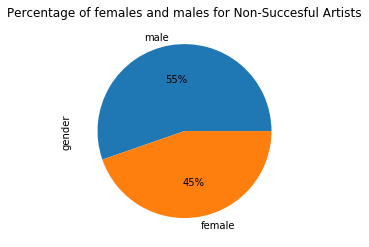

In [60]:
# Plot Male and Female Listeners for all data and key playlists
unsuccessful_in_2017['gender'].value_counts().plot.pie(autopct='%1.0f%%').set_title('Percentage of females and males for Non-Succesful Artists');

### c) Age & Gender

In [61]:
# Check Mean and Median Age for each Gender (Successful) 
successful_in_2017.groupby("gender")["age"].agg(["median", "mean"])

,median,mean
gender,,
female,25.000,27.506
male,28.000,30.696


In [62]:
# Check Mean and Median Age for each Gender (Unsuccessful)
unsuccessful_in_2017.groupby("gender")["age"].agg(["median", "mean"])

,median,mean
gender,,
female,29.000,30.864
male,31.000,34.249


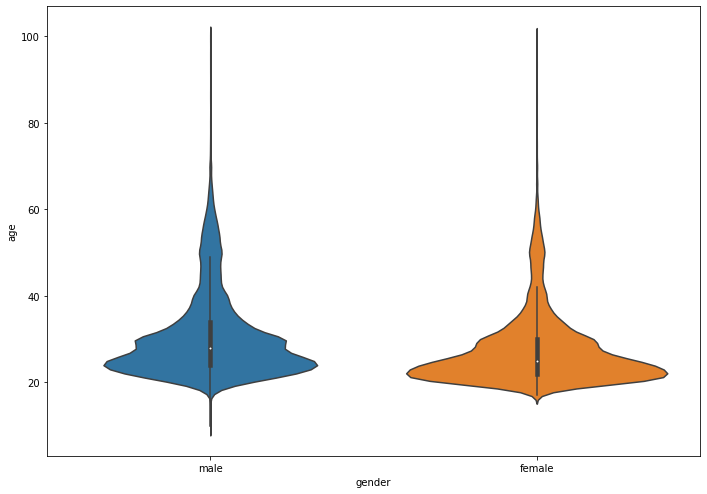

In [63]:
#Violin plots for age by gender (successful)
fig, ax = plt.subplots()
fig.set_size_inches(11.7, 8.27)
fig.set_size_inches(11.7, 8.27)
sns.violinplot(x="gender", y="age",data=successful_in_2017);

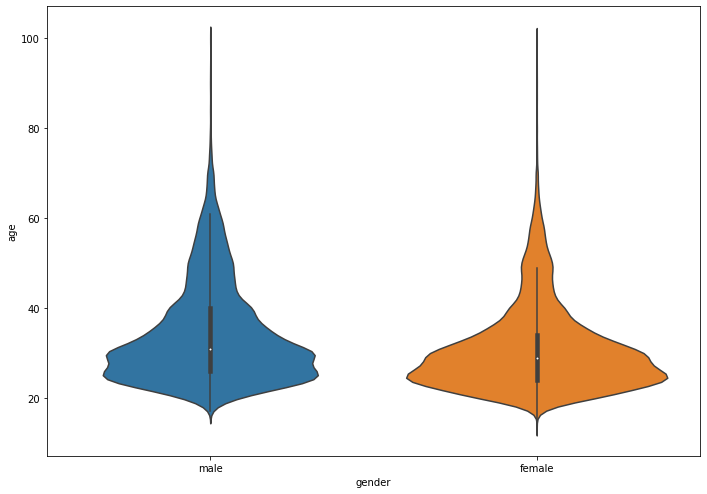

In [64]:
#Violin plots for age by gender (unsuccessful)
fig, ax = plt.subplots()
fig.set_size_inches(11.7, 8.27)
fig.set_size_inches(11.7, 8.27)
sns.violinplot(x="gender", y="age",data=unsuccessful_in_2017);

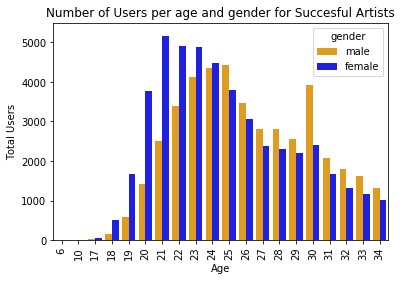

In [65]:
#TOTAL STREAMS BY AGE (Successful)
#convert age into integer 
fig, ax = pyplot.subplots()
successful_in_2017['age'] = successful_in_2017['age'].astype(int)
age_clean = successful_in_2017.loc[successful_in_2017['age']<35, ('age','gender')] #keep only below 35 so to avoid faulty entries
ax = sns.countplot(age_clean.age , hue=age_clean.gender, palette = ['orange', 'blue']);
ax.set(xlabel = 'Age' , ylabel='Total Users', title='Number of Users per age and gender for Succesful Artists');
ax.set(ylim=(0, 5500))
plt.xticks(rotation='vertical');



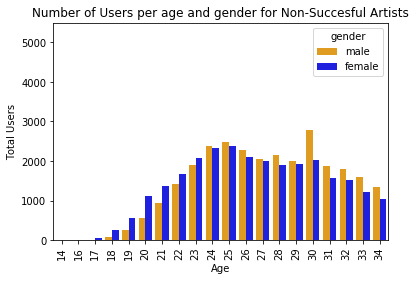

In [66]:
#TOTAL STREAMS BY AGE (Unsuccessful)
#convert age into integer 
fig, ax = pyplot.subplots()
unsuccessful_in_2017['age'] = unsuccessful_in_2017['age'].astype(int)
age_clean = unsuccessful_in_2017.loc[unsuccessful_in_2017['age']<35, ('age','gender')] #keep only below 35 so to avoid faulty entries
ax = sns.countplot(age_clean.age , hue=age_clean.gender, palette = ['orange', 'blue']);
ax.set(xlabel = 'Age' , ylabel='Total Users', title='Number of Users per age and gender for Non-Succesful Artists');
ax.set(ylim=(0, 5500))
plt.xticks(rotation='vertical');

## 2.3. Geolocation Attributes

In [67]:
# Check no. of streams per Area Name
successful_in_2017["Area Name"].value_counts().head(10)

London, City of    18280
Surrey              2702
Manchester          2315
Birmingham          2314
Hertfordshire       1962
Hampshire           1852
Glasgow City        1823
Leeds               1758
Nottingham          1548
Kent                1527
Name: Area Name, dtype: int64

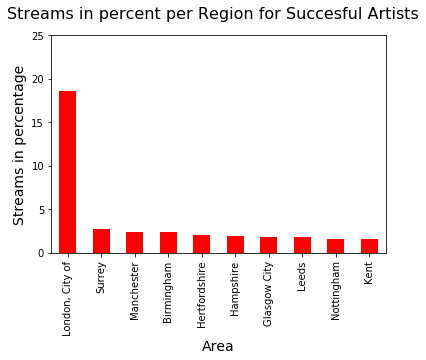

In [68]:
# Plot ratio of stream per region (Successful)
streams_per_area = successful_in_2017['Area Name'].value_counts(normalize=True)*100
ax = streams_per_area.nlargest(10).plot(kind='bar', color='red')
ax.set_ylim(0,25)
plt.xticks(rotation='vertical');
plt.suptitle('Streams in percent per Region for Succesful Artists', fontsize=16);
plt.xlabel('Area', fontsize=14);
plt.ylabel('Streams in percentage', fontsize=14)
plt.show();

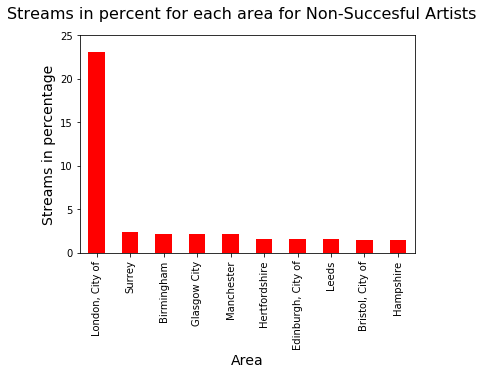

In [69]:
# Plot ratio of stream per region (Successful)
streams_per_area = unsuccessful_in_2017['Area Name'].value_counts(normalize=True)*100
ax = streams_per_area.nlargest(10).plot(kind='bar', color='red')
ax.set_ylim(0,25)
plt.xticks(rotation='vertical');
plt.suptitle('Streams in percent for each area for Non-Succesful Artists', fontsize=16);
plt.xlabel('Area', fontsize=14);
plt.ylabel('Streams in percentage', fontsize=14)
plt.show();

## 2.4. Device Attributes

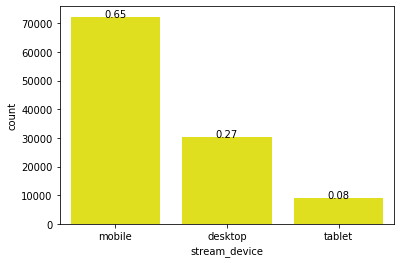

In [70]:
# Plot the device count and ratio (successful)
total = float(len(successful_in_2017)) 
ax = sns.countplot(x="stream_device",data=successful_in_2017, order = successful_in_2017['stream_device'].value_counts().index, palette = ['yellow']) 
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}'.format(height/total),
            ha="center") 
plt.show();

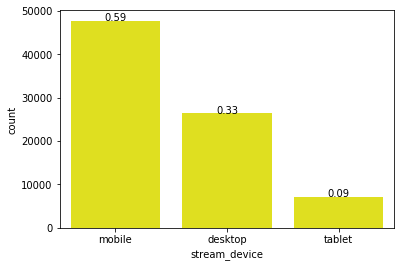

In [71]:
# Plot the device count and ratio (unsuccessful)
total = float(len(unsuccessful_in_2017)) 
ax = sns.countplot(x="stream_device",data=unsuccessful_in_2017, order = unsuccessful_in_2017['stream_device'].value_counts().index, palette = ['yellow']) 
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}'.format(height/total),
            ha="center") 
plt.show();

## 2.5. Profitability analysis

#### By artist

In [72]:
# Successful artists 
streams_by_artist_track_successful = successful_in_2017.groupby(['artist_name','track_name'])['isrc'].count().to_frame('number_of_streams')
streams_by_track_successful = streams_by_artist_track_successful.reset_index().sort_values(by='number_of_streams', ascending=False)
# streams_by_track_successful.head(10)

# Unsuccessful artists 
streams_by_artist_track_unsuccessful = unsuccessful_in_2017.groupby(['artist_name','track_name'])['isrc'].count().to_frame('number_of_streams')
streams_by_track_unsuccessful = streams_by_artist_track_unsuccessful.reset_index().sort_values(by='number_of_streams', ascending=False)
# streams_by_track_unsuccessful.head(10)

In [73]:
# Successful 
streams_by_artist_successful = streams_by_track_successful.groupby('artist_name')['number_of_streams'].agg('sum').reset_index().sort_values(by='number_of_streams', ascending=False)
streams_by_artist_successful['Monetary Value for Warner GBP'] = streams_by_artist_successful['number_of_streams']*0.0012
streams_by_artist_successful['Net Profits to Artist (total) GBP'] = streams_by_artist_successful['number_of_streams']/1000
streams_by_artist_successful['Net Profits to Warner GBP'] = streams_by_artist_successful['Monetary Value for Warner GBP'] - streams_by_artist_successful['Net Profits to Artist (total) GBP']
streams_by_artist_successful.set_index('artist_name', inplace=True)
streams_by_artist_successful.head(10)

# Unsuccessful 
streams_by_artist_unsuccessful = streams_by_track_unsuccessful.groupby('artist_name')['number_of_streams'].agg('sum').reset_index().sort_values(by='number_of_streams', ascending=False)
streams_by_artist_unsuccessful['Monetary Value for Warner GBP'] = streams_by_artist_unsuccessful['number_of_streams']*0.0012
streams_by_artist_unsuccessful['Net Profits to Artist (total) GBP'] = streams_by_artist_unsuccessful['number_of_streams']/1000
streams_by_artist_unsuccessful['Net Profits to Warner GBP'] = streams_by_artist_unsuccessful['Monetary Value for Warner GBP'] - streams_by_artist_unsuccessful['Net Profits to Artist (total) GBP']
streams_by_artist_unsuccessful.set_index('artist_name', inplace=True)
streams_by_artist_unsuccessful.head(10)

,number_of_streams,Monetary Value for Warner GBP,Net Profits to Artist (total) GBP,Net Profits to Warner GBP
artist_name,,,,
The Hunna,25579,30.695,25.579,5.116
Coasts,23016,27.619,23.016,4.603
RAT BOY,10930,13.116,10.930,2.186
dvsn,9956,11.947,9.956,1.991
A R I Z O N A,9825,11.790,9.825,1.965
Rationale,8778,10.534,8.778,1.756
Zak Abel,7677,9.212,7.677,1.535
Creeper,3919,4.703,3.919,0.784
Terror Jr,3252,3.902,3.252,0.650


,number_of_streams,Monetary Value for Warner GBP,Net Profits to Artist (total) GBP,Net Profits to Warner GBP
artist_name,,,,
Foy Vance,8734,10.481,8.734,1.747
VANT,5940,7.128,5.940,1.188
Gallant,5848,7.018,5.848,1.170
Icarus,5279,6.335,5.279,1.056
Greg Holden,4642,5.570,4.642,0.928
RedOne,4122,4.946,4.122,0.824
BETSY,3293,3.952,3.293,0.659
Elias,3034,3.641,3.034,0.607
Sturgill Simpson,2569,3.083,2.569,0.514


# 2.6 Geographical Representantion
Below we load the static picture of the map that illustrates the percentage of succesful streams by region in the UK.
The full code can be found in the folder "Map Visualisation".

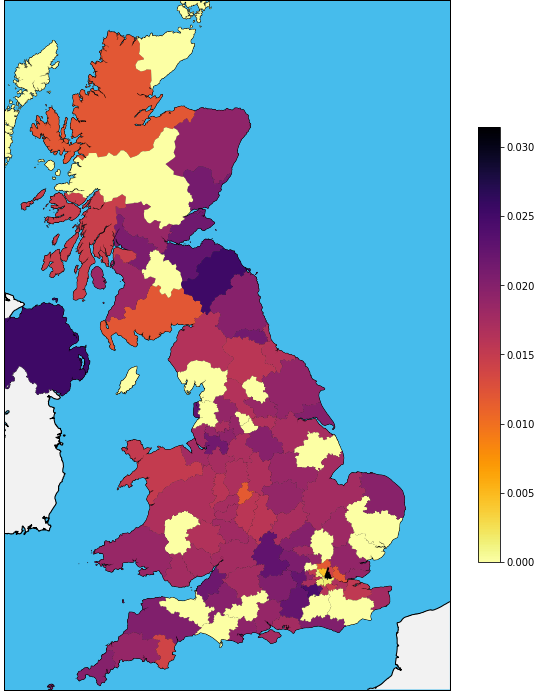

In [74]:
from IPython.display import Image
Image("./Map Visualisation/map_success.png")



## 3.	Data Preparation and Feature Engineering
<br>
From our business understanding, we know that our criteria for success is whether or not an artist has been on one of 4 key playlists.  The column ‘stream_source_uri’, contains data about the source of the stream – whether it was from an artist’s page, an album, a playlist etc. 

For streams coming from different playlists, only the Spotify URI code is provided. To make sense of this column and identify our key playlists, we can use the additional table provided that we cleaned above and named 'playlist_mapper'.

We can being by out data preperation by subsetting the 4 key playlists we are interested in and creating our dependent variable:

**Create Dependent Variable**

<div class="alert alert-warning">
<b>ACTION: Dependant variable </b> 

<p> Set up the problem as one of classification, selecting the relevant playlists as the variable we are trying to model.</p>

<p> Write useful helper functions to support creating of the feature vector and target vector </p>


</div>

In [75]:
# Create newdata df by merging the transactional df with the success column (resp_pred df)
newdata = trans_pred.merge(resp_pred, on = 'artist_name', how = 'left')
newdata.head()

,mobile,track_id,isrc,artist_name,track_name,album_name,customer_id,postal_code,access,country_code,gender,birth_year,region_code,partner_name,financial_product,user_product_type,stream_length,stream_source,stream_source_uri,stream_device,stream_os,track_artists,DateTime,hour,minute,week,month,year,date,weekday,weekday_name,playlist_id,playlist_name,Code,Area Name,success_2017
0,True,8f1924eab3804f308427c31d925c1b3f,USAT21600547,Sturgill Simpson,Call To Arms,A Sailor's Guide to Earth,6c022a8376c10aae37abb839eb7625fe,NE,free,GB,male,1968.000,GB-DUR,NaN,NaN,ad,277.000,album,NaN,mobile,Android,Sturgill Simpson,2016-05-10 12:15:00,12,15,19,5,2016,2016-05-10,1,Tuesday,NaN,NaN,GB-DUR,Durham County,0
1,True,8f1924eab3804f308427c31d925c1b3f,USAT21600547,Sturgill Simpson,Call To Arms,A Sailor's Guide to Earth,6c022a8376c10aae37abb839eb7625fe,NE,free,GB,male,1968.000,GB-DUR,NaN,NaN,ad,53.000,album,NaN,mobile,Android,Sturgill Simpson,2016-05-10 12:15:00,12,15,19,5,2016,2016-05-10,1,Tuesday,NaN,NaN,GB-DUR,Durham County,0
2,True,8f1924eab3804f308427c31d925c1b3f,USAT21600547,Sturgill Simpson,Call To Arms,A Sailor's Guide to Earth,352292382ff3ee0cfd3b73b94ea0ff8f,1,premium,GB,male,1995.000,GB-ESS,NaN,student,paid,326.000,collection,NaN,mobile,Android,Sturgill Simpson,2016-05-10 14:00:00,14,0,19,5,2016,2016-05-10,1,Tuesday,NaN,NaN,GB-ESS,Essex,0
3,True,8f1924eab3804f308427c31d925c1b3f,USAT21600547,Sturgill Simpson,Call To Arms,A Sailor's Guide to Earth,c3f2b54e76696ed491d9d8f964c97774,MK,premium,GB,male,1992.000,GB-HRT,NaN,student,paid,330.000,collection,NaN,tablet,iOS,Sturgill Simpson,2016-05-10 10:45:00,10,45,19,5,2016,2016-05-10,1,Tuesday,NaN,NaN,GB-HRT,Hertfordshire,0
4,True,8f1924eab3804f308427c31d925c1b3f,USAT21600547,Sturgill Simpson,Call To Arms,A Sailor's Guide to Earth,6a06a9bbe042c73e8f1a3596ec321636,KT,premium,GB,male,1979.000,GB-LND,NaN,NaN,paid,90.000,collection,NaN,mobile,iOS,Sturgill Simpson,2016-05-10 10:15:00,10,15,19,5,2016,2016-05-10,1,Tuesday,NaN,NaN,GB-LND,"London, City of",0


Now that we have created our dependent variable – whether an artist is successful or not, we can look at generating a set of features, based on the columns within our dataset, that we think might best explain the reasons for this success. 

**FEATURE ENGINEERING**

There are a large number of factors that could have an impact on the success of an artist, such as the influence of a playlist, or the popularity of an artist in a certain geographical region. 

To build a predictive model for this problem, we first need to turn these (largely qualitative) factors into measurable quantities. Characteristics like ‘influence’ and ‘popularity’ need to be quantified and standardized for all artists, to allow for a fair comparison. 

The accurateness of these numerical estimates will be the fundamental driver of success for any model we build. 
There are many approaches one might take to generate features. Based on the data columns available to us, a sensible approach is to divide our feature set into three groups:

1.	Artist Features
2.	Playlist Features
3.	User-base features


## Artist features

*	Stream count
*	Total Number of users
*	Passion Score 

The metric passion score is a metric suggested to us by Warner business analysts. 

It is defined as the number of stream divided by the total number of users. 

Warner analysts believe that repeated listens by a user is a far more indicative future success that simply total number of listens or total unique users. By including this in your model, we can evaluate whether this metric in fact might be of any significance.

<div class="alert alert-warning">
<b>ACTION: Artist features </b> 

<p> Write useful functions to create these new features. </p>


</div>

In [76]:
# Create Dataset that will be rows of artists and get the stream count for each one
df = pd.DataFrame(newdata.groupby("artist_name").size(), columns = ["stream_count"]).sort_values("stream_count", ascending = False)
df.head()

,stream_count
artist_name,
The Hunna,25746
Coasts,23168
RAT BOY,11005
dvsn,10018
A R I Z O N A,9874


In [77]:
# Number of users per artist
df["users_per_artist"] = newdata.groupby(["artist_name"])["customer_id"].nunique()
df.head()

,stream_count,users_per_artist
artist_name,,
The Hunna,25746,13933
Coasts,23168,17232
RAT BOY,11005,9035
dvsn,10018,7661
A R I Z O N A,9874,9040


In [78]:
# Passion Score
df["passion_score"] = df["stream_count"]/df["users_per_artist"]
df.head()

,stream_count,users_per_artist,passion_score
artist_name,,,
The Hunna,25746,13933,1.848
Coasts,23168,17232,1.344
RAT BOY,11005,9035,1.218
dvsn,10018,7661,1.308
A R I Z O N A,9874,9040,1.092


In [79]:
# Create a column that indicates the average ratio for the time that users listen to a song (out of total length)
temp = newdata.groupby(['artist_name', 'track_name'])['stream_length'].agg({'max' ,np.median})
temp['track_streamlength_ratio']=temp['median']/temp['max']
temp_art1=temp.groupby('artist_name')['median'].agg(np.median).to_frame('art_median_streamlength').reset_index()
temp_art2 = temp.reset_index().groupby('artist_name')['track_streamlength_ratio'].mean().to_frame('art_streamlength_ratio_mean')
df['art_streamlength_ratio_mean'] = temp_art2['art_streamlength_ratio_mean']
df.head()

,stream_count,users_per_artist,passion_score,art_streamlength_ratio_mean
artist_name,,,,
The Hunna,25746,13933,1.848,0.866
Coasts,23168,17232,1.344,0.824
RAT BOY,11005,9035,1.218,0.806
dvsn,10018,7661,1.308,0.737
A R I Z O N A,9874,9040,1.092,0.804


<div class="alert alert-success">

<p>We have now created our first three input features for each artist, merged together with the target variable which is whether each artist is successful or not. These three features are: the stream count, number of users and the passion score for each artist.</p>

</div>

## Playlist Features

Understanding an artist’s growth as a function of his/her movement across different playlists is potentially key to understanding how to identify and breakout new artists on Spotify. 

In turn, this could help us identify the most influential playlists and the reasons for their influence.

One way to model the effect of playlists on an artist’s performance has been to include them as categorical features in our model, to note if there are any particular playlists or combinations of playlists that are responsible for propelling an artist to future success:

### *Artist Feature 1 + Artist Feature 2 …. + Artist Feature N = Probability of Success*
**
Success (1) = Artist Features on Key Playlist
Failure (0) = Artist Not Featured on Key Playlist
**

Where,

**
⇒Artist Feature N = Prior Playlist 1 + Prior Playlist 2 +…Prior Playlist N
**


Given that we have over 19,000 playlists in our dataset or 600 artists, using the playlists each artist has featured on, as categorical variables would lead to too many features and a very large, sparse matrix. 

Instead, we need to think of ways to summarize the impact of these playlists. One way to do this would be to consider the top 20 playlists each artist has featured on. 

Even better would be to come up with one metric that captures the net effect of all top 20 prior playlists, for each artist, rather including using all 20 playlists for each artists as binary variables. The intuition here is that if this metric as a whole has an influence on the performance of an artist, it would suggest that rather than the individual playlists themselves, it is a combination of their generalized features that affects the future performance of an artist. 

Accordingly, different combinations of playlists could equate to having the same impact on an artist, thereby allowing us to identify undervalued playlists.

Some of the features such a metric could use is the number of unique users or ‘reach’, number of stream counts, and the passion score of each playlist

* Prior Playlist Stream Counts  (AVERAGE STREAM COUNT OF TOP 20 PLAYLISTS EACH ARTIST HAS FEATURED ON)
* Prior Playlist Unique Users (Reach) (AVERAGE UNIQUE USERS FOR TOP 20 PLAYLISTS EACH ARTIST HAS FEATURED ON)
* Prior Playlist Passion Score

There are several other such features that you could generate to better capture the general characteristics of playlists, such as the average lift in stream counts and users they generate for artists that have featured on them. 

The code to calculate these metrics is provided below:

<div class="alert alert-warning">
<b>ACTION: Playlist features </b> 

<p> Write useful functions to create new playlist features, like those listed in the cell above. </p>

<p> Are there other sensible ones you could suggest, work in your group to think about what other features might be useful and whether you can calculate them with the data you have </p>

</div>

In [80]:
newdata.groupby("artist_name")["success_2017"].value_counts().count()

282

In [81]:
newdata.head()

,mobile,track_id,isrc,artist_name,track_name,album_name,customer_id,postal_code,access,country_code,gender,birth_year,region_code,partner_name,financial_product,user_product_type,stream_length,stream_source,stream_source_uri,stream_device,stream_os,track_artists,DateTime,hour,minute,week,month,year,date,weekday,weekday_name,playlist_id,playlist_name,Code,Area Name,success_2017
0,True,8f1924eab3804f308427c31d925c1b3f,USAT21600547,Sturgill Simpson,Call To Arms,A Sailor's Guide to Earth,6c022a8376c10aae37abb839eb7625fe,NE,free,GB,male,1968.000,GB-DUR,NaN,NaN,ad,277.000,album,NaN,mobile,Android,Sturgill Simpson,2016-05-10 12:15:00,12,15,19,5,2016,2016-05-10,1,Tuesday,NaN,NaN,GB-DUR,Durham County,0
1,True,8f1924eab3804f308427c31d925c1b3f,USAT21600547,Sturgill Simpson,Call To Arms,A Sailor's Guide to Earth,6c022a8376c10aae37abb839eb7625fe,NE,free,GB,male,1968.000,GB-DUR,NaN,NaN,ad,53.000,album,NaN,mobile,Android,Sturgill Simpson,2016-05-10 12:15:00,12,15,19,5,2016,2016-05-10,1,Tuesday,NaN,NaN,GB-DUR,Durham County,0
2,True,8f1924eab3804f308427c31d925c1b3f,USAT21600547,Sturgill Simpson,Call To Arms,A Sailor's Guide to Earth,352292382ff3ee0cfd3b73b94ea0ff8f,1,premium,GB,male,1995.000,GB-ESS,NaN,student,paid,326.000,collection,NaN,mobile,Android,Sturgill Simpson,2016-05-10 14:00:00,14,0,19,5,2016,2016-05-10,1,Tuesday,NaN,NaN,GB-ESS,Essex,0
3,True,8f1924eab3804f308427c31d925c1b3f,USAT21600547,Sturgill Simpson,Call To Arms,A Sailor's Guide to Earth,c3f2b54e76696ed491d9d8f964c97774,MK,premium,GB,male,1992.000,GB-HRT,NaN,student,paid,330.000,collection,NaN,tablet,iOS,Sturgill Simpson,2016-05-10 10:45:00,10,45,19,5,2016,2016-05-10,1,Tuesday,NaN,NaN,GB-HRT,Hertfordshire,0
4,True,8f1924eab3804f308427c31d925c1b3f,USAT21600547,Sturgill Simpson,Call To Arms,A Sailor's Guide to Earth,6a06a9bbe042c73e8f1a3596ec321636,KT,premium,GB,male,1979.000,GB-LND,NaN,NaN,paid,90.000,collection,NaN,mobile,iOS,Sturgill Simpson,2016-05-10 10:15:00,10,15,19,5,2016,2016-05-10,1,Tuesday,NaN,NaN,GB-LND,"London, City of",0


In [82]:
# Convert date to datetime type
newdata['date'] = pd.to_datetime(newdata['date'])
# Filter data prior to the bias window 
newdata_prior=newdata[(newdata['date'] < '2016-10-01')]


In [83]:
print(np.shape(newdata))
print(np.shape(newdata_prior))

(197854, 36)
(159991, 36)


In [84]:
# There are artist 27 artist that are in the bias window period.
print(newdata["artist_name"].nunique())
print(newdata_prior["artist_name"].nunique())

282
255


In [85]:
# Now Create dataframe with prior playlists and the three metrics
# Stream count
playlists =  pd.DataFrame(newdata_prior.groupby("playlist_name").size(), columns = ["stream_count"]).sort_values("stream_count", ascending = False)

# Users per Playlist
playlists["users_per_playlist"] = newdata_prior.groupby(["playlist_name"])["customer_id"].nunique()

# Playlist Passion Score 
playlists["playlist_passion_score"] = playlists["stream_count"]/playlists["users_per_playlist"]
playlists = playlists.reset_index()


# Now Merge to add artist names
prior_df = newdata_prior[["artist_name","playlist_name","success_2017"]].merge(playlists, on = "playlist_name", how="outer")


In [86]:
np.shape(prior_df)

(159991, 6)

In [87]:
# Ranking the playlists with the use of the three metrics

# Define lists for the metrics and for rankings
metric_list =['stream_count','users_per_playlist','playlist_passion_score']
ranking_list =['stream_count_rank','users_per_playlist_rank','playlist_passion_score_rank']

# Define function to create ranking columns for each metric
def create_ranking_for_metrics(df, metric, rank_name):
    for x, y in zip(metric, rank_name):
        df[y] = df.groupby("artist_name")[x].rank("dense", ascending=False,)
    return df     

# Call function with the two lists    
prior_df = create_ranking_for_metrics(prior_df, metric_list, ranking_list)

In [88]:
# Get the top 20 playlists as ranked by stream count
top20 = prior_df[prior_df["stream_count_rank"] < 21]

In [89]:
pd.set_option('display.max_rows', None)
# remove duplicate streams (streams from same artist and same playlist)
top20=top20.drop_duplicates()
# sort the values from highest to lowest rank and select the top 20 from each artist. By ding this we take only the 20 first ignoring draw
top20.sort_values(by=["artist_name","stream_count_rank"])
top20=top20.groupby(["artist_name"]).head(20)

,artist_name,playlist_name,success_2017,stream_count,users_per_playlist,playlist_passion_score,stream_count_rank,users_per_playlist_rank,playlist_passion_score_rank
131956,99 Percent,Tomorrow's Hits,0,89.000,77.000,1.156,1.000,1.000,1.000
125623,99 Percent,Party Bangers!,0,15.000,15.000,1.000,2.000,2.000,2.000
143504,99 Percent,Topsify US Top 40,0,9.000,9.000,1.000,3.000,3.000,2.000
131907,99 Percent,Topsify US Dance Top 50,0,8.000,8.000,1.000,4.000,4.000,2.000
154453,99 Percent,jacob sartorius' musical.ly's.,0,4.000,4.000,1.000,5.000,5.000,2.000
154457,99 Percent,Musical.ly songs,0,3.000,3.000,1.000,6.000,6.000,2.000
154460,99 Percent,Top Songs of the Month - Sworkit Workout Playl...,0,3.000,3.000,1.000,6.000,6.000,2.000
154449,99 Percent,ROAD TRIP,0,2.000,2.000,1.000,7.000,7.000,2.000
154448,99 Percent,iTunes UK TOP 40 - Continously updated,0,1.000,1.000,1.000,8.000,8.000,2.000
154451,99 Percent,Tastemaker,0,1.000,1.000,1.000,8.000,8.000,2.000


In [90]:
# Aggregate the metrics using the mean of the top 20 prior playlists.
top20=top20.groupby("artist_name").agg("mean")
top20=top20[["stream_count","users_per_playlist","playlist_passion_score"]]
top20=top20.reset_index()

In [91]:
top20.head(5)

,artist_name,stream_count,users_per_playlist,playlist_passion_score
0,99 Percent,11.417,10.417,1.013
1,A Boogie Wit Da Hoodie,252.538,241.846,1.139
2,A R I Z O N A,414.700,387.100,1.094
3,AGWA,1.000,1.000,1.000
4,Adan Carmona,11.000,7.000,1.571


## User-base features

We can use the age and gender columns to create an audience profile per artist.
*	Gender Percentage Breakdown
*	Age vector quantization 


<div class="alert alert-warning">
<b>ACTION: User features </b> 

<p> Write useful functions to create new user features, like those listed in the cell above. </p>

<p> Are there other sensible ones you could suggest? Work in your group to think about what other features might be useful and whether you can calculate them with the data you have. Justify your reasoning. </p>

</div>

### Gender Percentage Breakdown

In [92]:
# Gender Percentage breakdown
# Create pivot
male_ratio = newdata.pivot_table(index='artist_name', columns='gender', aggfunc='size', fill_value=0)

# calculate male ratio
sums = male_ratio[["female","male"]].sum(axis=1)
male_ratio['MaleRatio'] = round(100 * male_ratio['male'] / sums , 1)

# result
male_ratio = male_ratio['MaleRatio'].reset_index()
male_ratio.head(5)

,artist_name,MaleRatio
0,99 Percent,31.400
1,A Boogie Wit Da Hoodie,77.900
2,A R I Z O N A,49.000
3,AGWA,100.000
4,ALMA,100.000


In [93]:
df=df.reset_index()
#top20=top20.reset_index()
top20.rename(columns={"stream_count":"playlist_stream_count"}, inplace=True)
#top20 prior playlists have 172 artist instead of 282 that's because the filtering removes some artist
print(df["artist_name"].nunique())
print(top20["artist_name"].nunique())
print(male_ratio["artist_name"].nunique())
df.head()

282
172
282


,artist_name,stream_count,users_per_artist,passion_score,art_streamlength_ratio_mean
0,The Hunna,25746,13933,1.848,0.866
1,Coasts,23168,17232,1.344,0.824
2,RAT BOY,11005,9035,1.218,0.806
3,dvsn,10018,7661,1.308,0.737
4,A R I Z O N A,9874,9040,1.092,0.804


In [94]:
# we need the succesful_2017 column add it with a merge
df=df.merge(newdata,on="artist_name", how="left")

# filter dataframe to the user characteristcs only
df=df[['artist_name', 'stream_count', 'users_per_artist', 'passion_score',
       'art_streamlength_ratio_mean',"success_2017"]]

# Merge the dataframes (Artist characteristics, prior playlists,male ratio) 
final=df.merge(top20,on="artist_name", how="left")
final_1=final.merge(male_ratio, on="artist_name", how='left')

# final_1 has the artist and their corresponding characteristcs.
final_1=final_1.groupby("artist_name").agg("mean")
final_1.head()

,stream_count,users_per_artist,passion_score,art_streamlength_ratio_mean,success_2017,playlist_stream_count,users_per_playlist,playlist_passion_score,MaleRatio
artist_name,,,,,,,,,
99 Percent,888,821,1.082,0.899,0,11.417,10.417,1.013,31.400
A Boogie Wit Da Hoodie,1789,1517,1.179,0.870,0,252.538,241.846,1.139,77.900
A R I Z O N A,9874,9040,1.092,0.804,1,414.700,387.100,1.094,49.000
AGWA,1,1,1.000,1.000,0,1.000,1.000,1.000,100.000
ALMA,2,2,1.000,1.000,0,nan,nan,nan,100.000


In [95]:
artist_list=final_1.index.values.tolist()

In [96]:
artist_list

['99 Percent',
 'A Boogie Wit Da Hoodie',
 'A R I Z O N A',
 'AGWA',
 'ALMA',
 'Adan Carmona',
 'Adia Victoria',
 'Alessio Bernabei',
 'Alex Hoyer',
 'Alex Roy',
 'Alexander Brown',
 'Alexander Cardinale',
 'Alice',
 'Aliose',
 'Alma',
 'Amaro Ferreiro',
 'Andy Bros',
 'Angel',
 'Angelica Garcia',
 'Anna Puu',
 'Annabel Jones',
 'Anteros',
 'Arco',
 'Arsen',
 'Asta',
 'Aubrie Sellers',
 'Axel Tony',
 'Aya Nakamura',
 'Ayosha',
 'BETSY',
 'Bang For The Buck',
 'Banks & Steelz',
 'Basic Tape',
 'Benjamin Beats',
 'Benjamin Beilman',
 'Betsy',
 'Bl!ndman',
 'Blair',
 'Blonder',
 'Boom Boom Cash',
 'Brace',
 'Brent Cobb',
 'Buslav',
 'Calypso Rose',
 'Chantal Kreviazuk',
 'Chris Holsten',
 'Clap Your Hands Say Yeah',
 'Claritzel',
 'Coasts',
 'Code Orange Kids',
 "Cookin' On 3 Burners",
 'Coro de Monjes del Monasterio Benedictino de Santo Domingo de Silos',
 'Cosculluela',
 'Coyote Kisses',
 'Creeper',
 'Cuckoolander',
 'Dae Dae',
 'Daniella Mason',
 'David Aaron Carpenter',
 'David Soliz'

In [97]:
final_1["success_2017"].value_counts()

0    257
1     25
Name: success_2017, dtype: int64

In [98]:
# Remove the response now and get it in a variable
response = final_1["success_2017"]
final_1 = final_1.drop("success_2017", 1) 

**Preprocessing**

Before we can run any models on our dataset, we must make sure it is prepared and cleaned to avoid errors in results. This stage is generally refered to as preprocessing.

To begin with, we need to deal with missing data in the dataframe - the ML algorithm will not be able to process NaN or missing values. 

For this study, we will be imputing missing numerical values, and filling any one which we were not able to imput, with 0.

<div class="alert alert-warning">
<b>ACTION: Missing values </b> 

<p> Use the <b>Imputer</b> class to alter your final Dataframe that contains your feature vector.</p>

</div>

### Check missing values and Impute accordingly

In [99]:
# Check missing values from dataframe
final_1.isnull().sum()

stream_count                     0
users_per_artist                 0
passion_score                    0
art_streamlength_ratio_mean      0
playlist_stream_count          110
users_per_playlist             110
playlist_passion_score         110
MaleRatio                        0
dtype: int64

In [100]:
# Function to impute missing values of specific columns with 0
def impute_0(df, columns, imputemethod):
    for i in columns:
     df[i].fillna(imputemethod, inplace=True)

# Function to impute missing values of specific columns with mean or median
def impute_mean_median(df,columns,imputemethod):
    from sklearn.impute import SimpleImputer
    imp = SimpleImputer(missing_values=np.nan, strategy=imputemethod)
    for i in columns:
        imp = imp.fit(df[[i]])
        df[i] = imp.transform(df[[i]]).ravel()

# Define list with columns to impute with 0
impute0 = ["playlist_stream_count", "users_per_playlist", "playlist_passion_score"]

# Call function with impute method 0
impute_0(final_1, impute0, 0)

In [101]:
# Make sure that we have no missing values left
final_1.isnull().sum()

stream_count                   0
users_per_artist               0
passion_score                  0
art_streamlength_ratio_mean    0
playlist_stream_count          0
users_per_playlist             0
playlist_passion_score         0
MaleRatio                      0
dtype: int64

In [102]:
final_1.head()

,stream_count,users_per_artist,passion_score,art_streamlength_ratio_mean,playlist_stream_count,users_per_playlist,playlist_passion_score,MaleRatio
artist_name,,,,,,,,
99 Percent,888,821,1.082,0.899,11.417,10.417,1.013,31.400
A Boogie Wit Da Hoodie,1789,1517,1.179,0.870,252.538,241.846,1.139,77.900
A R I Z O N A,9874,9040,1.092,0.804,414.700,387.100,1.094,49.000
AGWA,1,1,1.000,1.000,1.000,1.000,1.000,100.000
ALMA,2,2,1.000,1.000,0.000,0.000,0.000,100.000


# Import data from API

Below we load the data that were extracted from the Spotify API. It contains further aggregated metrics per artist. The full code for the creation of this data file can be found in the folder 'Spotify API'.


In [104]:
# Please refer to the Spotipy2.ipynb notebook in the spotipy folder for the code
# path ="/project/spotipy/Spotipy2.ipynb"
#https://developer.spotify.com/documentation/web-api/reference/tracks/get-audio-features/

# Import data from API
df_artist_features=pd.read_csv("./Spotify API/df_final_artist.csv")
df_artist_features.rename(columns={"artist":"artist_name"},inplace=True)
df_artist_features.set_index("artist_name",inplace=True)
df_artist_features = df_artist_features.add_prefix('API_')
final_1=final_1.join(df_artist_features, how="outer")

In [105]:
# Drop unnecessary columns
df_artist_features.drop(["API_duration_ms","API_time_signature"],axis=1).head(5)

,API_danceability,API_energy,API_key,API_loudness,API_mode,API_speechiness,API_acousticness,API_instrumentalness,API_liveness,API_valence,API_tempo
artist_name,,,,,,,,,,,
99 Percent,0.703,0.785,6.106,-5.311,0.452,0.113,0.061,0.007,0.191,0.515,121.103
A Boogie Wit Da Hoodie,0.691,0.604,5.461,-6.667,0.441,0.250,0.285,0.000,0.128,0.471,125.335
A R I Z O N A,0.673,0.659,3.190,-6.950,0.905,0.050,0.149,0.088,0.138,0.357,112.628
AGWA,0.729,0.413,3.375,-9.187,0.750,0.155,0.461,0.000,0.165,0.637,118.621
ALMA,0.532,0.503,6.300,-7.526,0.961,0.080,0.620,0.005,0.189,0.869,155.439


In [106]:
#Drop unessesary columns from API features
final_1.drop(["API_duration_ms","API_time_signature"],axis=1,inplace=True)

In [107]:
final_1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 282 entries, 99 Percent to livetune+
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   stream_count                 282 non-null    int64  
 1   users_per_artist             282 non-null    int64  
 2   passion_score                282 non-null    float64
 3   art_streamlength_ratio_mean  282 non-null    float64
 4   playlist_stream_count        282 non-null    float64
 5   users_per_playlist           282 non-null    float64
 6   playlist_passion_score       282 non-null    float64
 7   MaleRatio                    282 non-null    float64
 8   API_danceability             282 non-null    float64
 9   API_energy                   282 non-null    float64
 10  API_key                      282 non-null    float64
 11  API_loudness                 282 non-null    float64
 12  API_mode                     282 non-null    float64
 13  API_speech

### Standardize all the features

Next, we need to make sure that none of the variables going into the model are collinear, and if so, we need to remove those variables that are highly correlated.

<div class="alert alert-warning">
<b>ACTION: Multi-collinearity </b> 

<p> Check and deal with multi-collinearity in your feature set.</p>

</div>

### Correlation Matrix 

In [108]:
# Plot Correlation Matrix to check multi-collinearity
corr = final_1.corr()
corr.style.background_gradient(cmap='coolwarm').set_precision(3)

,stream_count,users_per_artist,passion_score,art_streamlength_ratio_mean,playlist_stream_count,users_per_playlist,playlist_passion_score,MaleRatio,API_danceability,API_energy,API_key,API_loudness,API_mode,API_speechiness,API_acousticness,API_instrumentalness,API_liveness,API_valence,API_tempo
stream_count,1.000,0.981,0.038,-0.313,0.587,0.587,0.176,-0.038,0.013,-0.026,-0.036,0.035,0.075,-0.048,-0.040,0.029,0.004,-0.127,0.025
users_per_artist,0.981,1.000,0.023,-0.356,0.633,0.634,0.194,-0.041,0.021,-0.034,-0.037,0.034,0.075,-0.047,-0.037,0.029,0.015,-0.135,0.013
passion_score,0.038,0.023,1.000,0.058,-0.036,-0.035,-0.141,0.124,-0.074,-0.083,0.030,-0.039,-0.084,0.016,0.177,-0.038,-0.056,0.009,-0.081
art_streamlength_ratio_mean,-0.313,-0.356,0.058,1.000,-0.416,-0.410,-0.256,0.021,-0.006,0.052,-0.074,-0.002,-0.092,0.016,-0.007,-0.015,0.044,0.102,0.020
playlist_stream_count,0.587,0.633,-0.036,-0.416,1.000,1.000,0.348,-0.011,-0.092,-0.068,-0.023,0.014,0.078,0.016,0.003,0.024,0.012,-0.204,0.000
users_per_playlist,0.587,0.634,-0.035,-0.410,1.000,1.000,0.343,-0.009,-0.094,-0.071,-0.027,0.010,0.080,0.018,0.006,0.026,0.013,-0.203,-0.002
playlist_passion_score,0.176,0.194,-0.141,-0.256,0.348,0.343,1.000,-0.159,0.032,0.112,0.044,0.107,0.099,-0.002,-0.124,-0.107,0.080,0.016,0.043
MaleRatio,-0.038,-0.041,0.124,0.021,-0.011,-0.009,-0.159,1.000,-0.110,0.030,-0.025,-0.005,-0.082,0.021,-0.063,0.112,0.043,-0.072,0.054
API_danceability,0.013,0.021,-0.074,-0.006,-0.092,-0.094,0.032,-0.110,1.000,0.326,0.141,0.420,-0.281,0.316,-0.370,-0.352,-0.219,0.501,0.175
API_energy,-0.026,-0.034,-0.083,0.052,-0.068,-0.071,0.112,0.030,0.326,1.000,0.107,0.819,-0.227,0.071,-0.812,-0.261,0.167,0.364,0.474


### Reducing the dataset with Variance Inflation Factor
### Not applied in our model as we use decision trees

The following function can be used in case a different type of algorithm will be used for prediction

In [109]:
#Not used as we finally use a decision tree as a model
'''# Function to calculate VIF and drop variables above a certain threshold
def calculate_vif_(X, thresh):
    from statsmodels.stats.outliers_influence import variance_inflation_factor
    variables = list(range(X.shape[1]))
    dropped = True
    while dropped:
        dropped = False
        vif = [variance_inflation_factor(X.iloc[:, variables].values, ix)
               for ix in range(X.iloc[:, variables].shape[1])]
        
        maxloc = vif.index(max(vif))
        if max(vif) > thresh:
            print('dropping \'' + X.iloc[:, variables].columns[maxloc] +
                  '\' at index: ' + str(maxloc))
            del variables[maxloc]
            dropped = True

    print('Remaining variables:')
    print(X.columns[variables])
    return X.iloc[:, variables]
'''
# Set the threshold for each variable to have a VIF value less than 5 and call function
#thresh = 10

#final_1 = calculate_vif_(final_1, thresh)

"# Function to calculate VIF and drop variables above a certain threshold\ndef calculate_vif_(X, thresh):\n    from statsmodels.stats.outliers_influence import variance_inflation_factor\n    variables = list(range(X.shape[1]))\n    dropped = True\n    while dropped:\n        dropped = False\n        vif = [variance_inflation_factor(X.iloc[:, variables].values, ix)\n               for ix in range(X.iloc[:, variables].shape[1])]\n        \n        maxloc = vif.index(max(vif))\n        if max(vif) > thresh:\n            print('dropping '' + X.iloc[:, variables].columns[maxloc] +\n                  '' at index: ' + str(maxloc))\n            del variables[maxloc]\n            dropped = True\n\n    print('Remaining variables:')\n    print(X.columns[variables])\n    return X.iloc[:, variables]\n"

In [110]:
final_1.head()

,stream_count,users_per_artist,passion_score,art_streamlength_ratio_mean,playlist_stream_count,users_per_playlist,playlist_passion_score,MaleRatio,API_danceability,API_energy,API_key,API_loudness,API_mode,API_speechiness,API_acousticness,API_instrumentalness,API_liveness,API_valence,API_tempo
artist_name,,,,,,,,,,,,,,,,,,,
99 Percent,888,821,1.082,0.899,11.417,10.417,1.013,31.400,0.703,0.785,6.106,-5.311,0.452,0.113,0.061,0.007,0.191,0.515,121.103
A Boogie Wit Da Hoodie,1789,1517,1.179,0.870,252.538,241.846,1.139,77.900,0.691,0.604,5.461,-6.667,0.441,0.250,0.285,0.000,0.128,0.471,125.335
A R I Z O N A,9874,9040,1.092,0.804,414.700,387.100,1.094,49.000,0.673,0.659,3.190,-6.950,0.905,0.050,0.149,0.088,0.138,0.357,112.628
AGWA,1,1,1.000,1.000,1.000,1.000,1.000,100.000,0.729,0.413,3.375,-9.187,0.750,0.155,0.461,0.000,0.165,0.637,118.621
ALMA,2,2,1.000,1.000,0.000,0.000,0.000,100.000,0.532,0.503,6.300,-7.526,0.961,0.080,0.620,0.005,0.189,0.869,155.439


In [111]:
# create age columns
newdata['age'] = 2020 - newdata['birth_year']

newdata.loc[newdata['age'].between(0, 101, inclusive=False), 'age'] = 2020 - newdata['birth_year']
#everyone with age > 100 --> assign age == 0 
newdata.loc[newdata['age'].between(101, 200, inclusive=True), 'age'] = 0

## PCAs:

## 1. Age bin & Regions PCA 

## Age bins Processing

### Age Bins Percentages

In [112]:
# Age breakdown percentages
# Create bin ranges and names
bin_ranges = [15, 20, 25, 30, 35, 40, 50, 60, 75, 99]
bin_names = [
            'Age Bin 15-20', 'Age Bin 20-25', 'Age Bin 25-30',
             'Age Bin 30-35', 'Age Bin 35-40', 'Age Bin 40-50', 
             'Age Bin 50-60','Age Bin 60-75', 'Age Bin 75-99'
            ]

# Use cut to make bins
newdata['age_bin'] = pd.cut(np.array(newdata['age']),
                               bins=bin_ranges, labels=bin_names)

age_bins_count = newdata.pivot_table(index='artist_name', columns='age_bin', aggfunc='size', fill_value=0)

# calculate age bins ratio
sums = age_bins_count[[ 
            'Age Bin 15-20', 'Age Bin 20-25', 'Age Bin 25-30',
             'Age Bin 30-35', 'Age Bin 35-40', 'Age Bin 40-50', 
             'Age Bin 50-60','Age Bin 60-75', 'Age Bin 75-99'
            ]].sum(axis=1)

# Create the percentages
age_bins_perc = pd.DataFrame()
for i in bin_names:
    age_bins_perc[i] = (round(100 * age_bins_count[i] / sums , 2)  )

In [113]:
age_bins_perc.head()

,Age Bin 15-20,Age Bin 20-25,Age Bin 25-30,Age Bin 30-35,Age Bin 35-40,Age Bin 40-50,Age Bin 50-60,Age Bin 60-75,Age Bin 75-99
artist_name,,,,,,,,,
99 Percent,24.970,35.980,16.800,5.450,2.950,9.190,3.970,0.680,0.000
A Boogie Wit Da Hoodie,7.640,40.360,28.670,11.350,4.610,3.880,3.040,0.390,0.060
A R I Z O N A,4.340,31.120,28.360,15.220,6.750,8.530,4.760,0.870,0.060
AGWA,0.000,0.000,0.000,0.000,0.000,0.000,100.000,0.000,0.000
ALMA,0.000,0.000,50.000,50.000,0.000,0.000,0.000,0.000,0.000


### Age Bins Count

In [114]:
age_bins_count.head()

age_bin,Age Bin 15-20,Age Bin 20-25,Age Bin 25-30,Age Bin 30-35,Age Bin 35-40,Age Bin 40-50,Age Bin 50-60,Age Bin 60-75,Age Bin 75-99
artist_name,,,,,,,,,
99 Percent,220,317,148,48,26,81,35,6,0
A Boogie Wit Da Hoodie,136,718,510,202,82,69,54,7,1
A R I Z O N A,426,3057,2786,1495,663,838,468,85,6
AGWA,0,0,0,0,0,0,1,0,0
ALMA,0,0,1,1,0,0,0,0,0


### All Ages Count

In [115]:
# Create a dataset that shows all ages counts by artist
ages_counts = newdata.groupby(["artist_name", "age"])["region_code"].count().unstack().fillna(0)
ages_counts.head()

age,0.000,6.000,10.000,14.000,16.000,17.000,18.000,19.000,20.000,21.000,22.000,23.000,24.000,25.000,26.000,27.000,28.000,29.000,30.000,31.000,32.000,33.000,34.000,35.000,36.000,37.000,38.000,39.000,40.000,41.000,42.000,43.000,44.000,45.000,46.000,47.000,48.000,49.000,50.000,51.000,52.000,53.000,54.000,55.000,56.000,57.000,58.000,59.000,60.000,61.000,62.000,63.000,64.000,65.000,66.000,67.000,68.000,69.000,70.000,71.000,72.000,73.000,74.000,75.000,76.000,77.000,78.000,79.000,80.000,81.000,82.000,83.000,84.000,85.000,86.000,87.000,88.000,89.000,90.000,91.000,92.000,93.000,94.000,95.000,96.000,97.000,98.000,99.000,100.000
artist_name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
99 Percent,2.000,0.000,0.000,0.000,0.000,7.000,35.000,70.000,105.000,75.000,50.000,70.000,56.000,57.000,33.000,34.000,22.000,16.000,36.000,17.000,10.000,6.000,7.000,6.000,4.000,7.000,4.000,6.000,5.000,3.000,5.000,7.000,11.000,3.000,10.000,6.000,13.000,12.000,10.000,8.000,4.000,3.000,3.000,2.000,4.000,3.000,2.000,4.000,0.000,2.000,1.000,1.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
A Boogie Wit Da Hoodie,6.000,0.000,0.000,0.000,0.000,1.000,11.000,38.000,82.000,100.000,120.000,173.000,167.000,138.000,104.000,112.000,98.000,58.000,115.000,66.000,44.000,27.000,28.000,24.000,15.000,12.000,15.000,10.000,22.000,13.000,7.000,5.000,2.000,8.000,7.000,10.000,2.000,5.000,7.000,6.000,8.000,8.000,7.000,4.000,3.000,14.000,2.000,0.000,0.000,2.000,3.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
A R I Z O N A,17.000,0.000,0.000,0.000,0.000,5.000,48.000,105.000,253.000,377.000,473.000,650.000,732.000,697.000,624.000,478.000,510.000,449.000,531.000,391.000,311.000,282.000,197.000,214.000,147.000,139.000,118.000,102.000,115.000,118.000,88.000,88.000,73.000,79.000,82.000,81.000,59.000,64.000,69.000,66.000,60.000,58.000,60.000,53.000,43.000,39.000,25.000,28.000,22.000,12.000,15.000,12.000,8.000,5.000,5.000,7.000,4.000,2.000,3.000,2.000,0.000,3.000,2.000,1.000,2.000,0.000,1.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,1.000
AGWA,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
ALMA,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000


### All Ages Percentages

In [116]:
# Create a dataset that shows  perventages for every age by artist
ages_perc = pd.DataFrame()
sums = ages_counts.sum(axis=1)

# Create the percentages
for i in ages_counts.columns:
    ages_perc[i] = (round(100 * ages_counts[i] / sums , 2))
ages_perc.head()

,0.000,6.000,10.000,14.000,16.000,17.000,18.000,19.000,20.000,21.000,22.000,23.000,24.000,25.000,26.000,27.000,28.000,29.000,30.000,31.000,32.000,33.000,34.000,35.000,36.000,37.000,38.000,39.000,40.000,41.000,42.000,43.000,44.000,45.000,46.000,47.000,48.000,49.000,50.000,51.000,52.000,53.000,54.000,55.000,56.000,57.000,58.000,59.000,60.000,61.000,62.000,63.000,64.000,65.000,66.000,67.000,68.000,69.000,70.000,71.000,72.000,73.000,74.000,75.000,76.000,77.000,78.000,79.000,80.000,81.000,82.000,83.000,84.000,85.000,86.000,87.000,88.000,89.000,90.000,91.000,92.000,93.000,94.000,95.000,96.000,97.000,98.000,99.000,100.000
artist_name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
99 Percent,0.230,0.000,0.000,0.000,0.000,0.820,4.080,8.160,12.240,8.740,5.830,8.160,6.530,6.640,3.850,3.960,2.560,1.860,4.200,1.980,1.170,0.700,0.820,0.700,0.470,0.820,0.470,0.700,0.580,0.350,0.580,0.820,1.280,0.350,1.170,0.700,1.520,1.400,1.170,0.930,0.470,0.350,0.350,0.230,0.470,0.350,0.230,0.470,0.000,0.230,0.120,0.120,0.000,0.000,0.120,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
A Boogie Wit Da Hoodie,0.350,0.000,0.000,0.000,0.000,0.060,0.640,2.220,4.790,5.840,7.010,10.110,9.750,8.060,6.070,6.540,5.720,3.390,6.720,3.860,2.570,1.580,1.640,1.400,0.880,0.700,0.880,0.580,1.290,0.760,0.410,0.290,0.120,0.470,0.410,0.580,0.120,0.290,0.410,0.350,0.470,0.470,0.410,0.230,0.180,0.820,0.120,0.000,0.000,0.120,0.180,0.000,0.000,0.000,0.000,0.000,0.060,0.060,0.000,0.000,0.000,0.000,0.000,0.000,0.060,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
A R I Z O N A,0.180,0.000,0.000,0.000,0.000,0.050,0.520,1.130,2.720,4.050,5.080,6.980,7.870,7.490,6.700,5.140,5.480,4.820,5.710,4.200,3.340,3.030,2.120,2.300,1.580,1.490,1.270,1.100,1.240,1.270,0.950,0.950,0.780,0.850,0.880,0.870,0.630,0.690,0.740,0.710,0.640,0.620,0.640,0.570,0.460,0.420,0.270,0.300,0.240,0.130,0.160,0.130,0.090,0.050,0.050,0.080,0.040,0.020,0.030,0.020,0.000,0.030,0.020,0.010,0.020,0.000,0.010,0.000,0.000,0.000,0.010,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.010,0.000,0.000,0.000,0.000,0.010
AGWA,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,100.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
ALMA,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,50.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,50.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000


### Region Codes Count

In [117]:
# Create a dataset that shows all region codes by artist
region_codes_df = newdata.groupby(["artist_name", "region_code"])["region_code"].count().unstack().fillna(0)
region_codes_df.head()

region_code,GB-ABD,GB-ABE,GB-AGB,GB-AGY,GB-ANS,GB-ANT,GB-ARD,GB-ARM,GB-BAS,GB-BBD,GB-BDG,GB-BEN,GB-BEX,GB-BFS,GB-BGE,GB-BGW,GB-BIR,GB-BKM,GB-BLA,GB-BLY,GB-BMH,GB-BNB,GB-BNE,GB-BNH,GB-BNS,GB-BOL,GB-BPL,GB-BRC,GB-BRD,GB-BRY,GB-BST,GB-BUR,GB-CAM,GB-CAY,GB-CBF,GB-CGN,GB-CGV,GB-CHE,GB-CKF,GB-CKT,GB-CLD,GB-CLK,GB-CLR,GB-CMA,GB-CMD,GB-CMN,GB-CON,GB-COV,GB-CRF,GB-CRY,GB-CWY,GB-DAL,GB-DBY,GB-DEN,GB-DER,GB-DEV,GB-DGN,GB-DGY,GB-DNC,GB-DND,GB-DOR,GB-DOW,GB-DRY,GB-DUD,GB-DUR,GB-EAL,GB-EAY,GB-EDH,GB-ELN,GB-ELS,GB-ENF,GB-ERW,GB-ERY,GB-ESS,GB-ESX,GB-FAL,GB-FER,GB-FIF,GB-FLN,GB-GAT,GB-GLG,GB-GLS,GB-GRE,GB-GWN,GB-HAL,GB-HAM,GB-HAV,GB-HCK,GB-HEF,GB-HIL,GB-HLD,GB-HMF,GB-HNS,GB-HPL,GB-HRT,GB-HRW,GB-HRY,GB-IOW,GB-ISL,GB-IVC,GB-KEC,GB-KEN,GB-KHL,GB-KIR,GB-KTT,GB-KWL,GB-LAN,GB-LBH,GB-LCE,GB-LDS,GB-LEC,GB-LEW,GB-LIN,GB-LIV,GB-LMV,GB-LND,GB-LRN,GB-LSB,GB-LUT,GB-MAN,GB-MDW,GB-MFT,GB-MIK,GB-MLN,GB-MON,GB-MRT,GB-MRY,GB-MTY,GB-MYL,GB-NAY,GB-NBL,GB-NDN,GB-NEL,GB-NET,GB-NFK,GB-NGM,GB-NLK,GB-NLN,GB-NSM,GB-NTA,GB-NTH,GB-NTL,GB-NTT,GB-NTY,GB-NWM,GB-NWP,GB-NYK,GB-NYM,GB-OLD,GB-OMH,GB-ORK,GB-OXF,GB-PEM,GB-PKN,GB-PLY,GB-POL,GB-POR,GB-POW,GB-PTE,GB-RCC,GB-RCH,GB-RCT,GB-RDB,GB-RDG,GB-RFW,GB-RIC,GB-ROT,GB-RUT,GB-SAW,GB-SAY,GB-SCB,GB-SFK,GB-SFT,GB-SGC,GB-SHF,GB-SHN,GB-SHR,GB-SKP,GB-SLF,GB-SLG,GB-SLK,GB-SND,GB-SOL,GB-SOM,GB-SOS,GB-SRY,GB-STB,GB-STE,GB-STG,GB-STH,GB-STN,GB-STS,GB-STT,GB-STY,GB-SWA,GB-SWD,GB-SWK,GB-TAM,GB-TFW,GB-THR,GB-TOB,GB-TOF,GB-TRF,GB-TWH,GB-VGL,GB-WAR,GB-WBK,GB-WDU,GB-WFT,GB-WGN,GB-WIL,GB-WKF,GB-WLL,GB-WLN,GB-WLV,GB-WND,GB-WNM,GB-WOK,GB-WOR,GB-WRL,GB-WRT,GB-WRX,GB-WSM,GB-WSX,GB-YOR,GB-ZET
artist_name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
99 Percent,0.000,4.000,0.000,1.000,2.000,0.000,2.000,1.000,3.000,7.000,3.000,1.000,0.000,13.000,1.000,0.000,19.000,4.000,1.000,0.000,2.000,0.000,0.000,7.000,1.000,1.000,4.000,2.000,4.000,6.000,20.000,0.000,7.000,7.000,2.000,0.000,1.000,4.000,0.000,0.000,4.000,0.000,1.000,7.000,0.000,1.000,8.000,3.000,6.000,4.000,1.000,0.000,2.000,0.000,3.000,6.000,0.000,1.000,3.000,2.000,1.000,0.000,3.000,1.000,3.000,1.000,1.000,16.000,2.000,0.000,2.000,0.000,1.000,16.000,5.000,2.000,0.000,4.000,3.000,2.000,22.000,13.000,0.000,0.000,0.000,15.000,3.000,0.000,1.000,4.000,1.000,0.000,5.000,0.000,12.000,1.000,0.000,2.000,0.000,0.000,0.000,12.000,3.000,2.000,10.000,1.000,9.000,0.000,8.000,10.000,2.000,0.000,4.000,8.000,0.000,115.000,0.000,0.000,5.000,22.000,3.000,0.000,11.000,0.000,2.000,2.000,1.000,0.000,0.000,0.000,2.000,1.000,2.000,3.000,12.000,12.000,2.000,2.000,0.000,1.000,9.000,0.000,5.000,5.000,0.000,4.000,3.000,1.000,2.000,0.000,0.000,19.000,0.000,7.000,3.000,1.000,5.000,2.000,6.000,2.000,0.000,4.000,2.000,6.000,1.000,2.000,4.000,0.000,1.000,0.000,1.000,11.000,0.000,0.000,12.000,8.000,5.000,1.000,2.000,1.000,2.000,0.000,2.000,14.000,0.000,18.000,0.000,9.000,4.000,7.000,4.000,0.000,1.000,1.000,5.000,4.000,0.000,0.000,6.000,1.000,0.000,4.000,0.000,0.000,1.000,1.000,0.000,0.000,0.000,4.000,12.000,2.000,2.000,0.000,3.000,0.000,4.000,0.000,8.000,1.000,1.000,3.000,0.000,8.000,5.000,0.000
A Boogie Wit Da Hoodie,1.000,9.000,0.000,0.000,0.000,0.000,0.000,0.000,5.000,0.000,2.000,6.000,5.000,5.000,1.000,3.000,69.000,6.000,0.000,0.000,2.000,1.000,8.000,14.000,1.000,4.000,4.000,2.000,5.000,11.000,25.000,1.000,13.000,4.000,8.000,0.000,0.000,14.000,1.000,1.000,0.000,0.000,1.000,0.000,3.000,3.000,4.000,15.000,15.000,12.000,0.000,0.000,8.000,0.000,10.000,4.000,0.000,0.000,3.000,2.000,1.000,0.000,3.000,9.000,4.000,8.000,2.000,8.000,0.000,0.000,23.000,0.000,1.000,36.000,5.000,2.000,0.000,6.000,3.000,7.000,21.000,17.000,1.000,1.000,2.000,40.000,9.000,0.000,1.000,7.000,2.000,0.000,12.000,0.000,39.000,16.000,1.000,0.000,1.000,1.000,1.000,25.000,2.000,1.000,10.000,1.000,4.000,1.000,15.000,18.000,3.000,1.000,10.000,16.000,0.000,463.000,0.000,1.000,8.000,45.000,10.000,

In [118]:
ages_perc = ages_perc.loc[ages_perc.index.isin(region_codes_df.index)]
ages_perc.shape

(273, 89)

In [119]:
age_bins_perc = age_bins_perc.loc[age_bins_perc.index.isin(region_codes_df.index)]
response_after_region = response.loc[response.index.isin(region_codes_df.index)]

### Create a Universal train test split for all datasets

In [120]:
# Split the data into training and testing sets
# 80% of the data will be our training set and 20% the test set
X_train, X_test, y_train, y_test = train_test_split(region_codes_df, response_after_region, test_size=0.25, random_state=889, stratify=response_after_region)
#print(X_train.shape)
#print(X_test.shape)

# Take the artist names of each of the sets for re-use
train_artists = X_train.index.tolist()
test_artists = X_test.index.tolist()

In [121]:
def pca10_train_test(df):
    # Train-Test Split
    X_train = df.loc[train_artists,:]
    X_test = df.loc[test_artists,:]
    # Instantiate standard scaler
    scaler = MinMaxScaler()
    # Fit on the train set
    scaler.fit(X_train)
    # Transform train and test separately
    scaled_train = scaler.transform(X_train)
    scaled_test = scaler.transform(X_test)
    # Instantiate PCA with 10 principal components
    pca = decomposition.PCA(n_components = 10)
    # Fit PCA on the train set
    pcafit = pca.fit(scaled_train)
    # Transform on train and test separately
    pca_train = pcafit.transform(scaled_train)
    pca_test = pcafit.transform(scaled_test)
    # Create dataframes of PCs with artist names column
    pca_train_df = pd.DataFrame(data = pca_train, index = X_train.index, columns = (['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10'])).reset_index()
    pca_test_df = pd.DataFrame(data = pca_test, index = X_test.index, columns = (['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10'])).reset_index()
    # Create complete train and test dfs by merging each one with the previously created columns
    #train = pca_train_df.merge(a.reset_index(), on = "artist_name", how = "left")
    #test = pca_test_df.merge(a.reset_index(), on = "artist_name", how = "left")
    return pca_train_df, pca_test_df

In [122]:
pca_regions_train, pca_regions_test = pca10_train_test(region_codes_df)

In [123]:
pca_ages_count_train, pca_ages_count_test = pca10_train_test(ages_counts)

In [124]:
pca_ages_perc_train, pca_ages_perc_test = pca10_train_test(ages_perc)

### Merge above dfs to create the 4 scenarios

In [125]:
# Age Bins Count (No PCA) and region codes PCA
age_bins_count_train = pca_regions_train.merge(age_bins_count, how = "left", on = "artist_name").merge(final_1, how = "left", on = "artist_name").drop("artist_name", axis = 1)
age_bins_count_test = pca_regions_test.merge(age_bins_count, how = "left", on = "artist_name").merge(final_1, how = "left", on = "artist_name").drop("artist_name", axis = 1)

In [126]:
# Age Bins Percentages (No PCA) and region codes PCA
age_bins_perc_train = pca_regions_train.merge(age_bins_perc.reset_index(), how = "left", on = "artist_name").merge(final_1, how = "left", on = "artist_name").drop("artist_name", axis = 1)
age_bins_perc_test = pca_regions_test.merge(age_bins_perc.reset_index(), how = "left", on = "artist_name").merge(final_1, how = "left", on = "artist_name").drop("artist_name", axis = 1)

In [127]:
# All Ages Counts (PCA) and region codes PCA
ages_count_train = pca_regions_train.merge(pca_ages_count_train, how = "left", on = "artist_name").merge(final_1, how = "left", on = "artist_name").drop("artist_name", axis = 1)
ages_count_test = pca_regions_test.merge(pca_ages_count_test, how = "left", on = "artist_name").merge(final_1, how = "left", on = "artist_name").drop("artist_name", axis = 1)

In [128]:
# All Ages Percentages (PCA) AND region codes PCA
ages_perc_train = pca_regions_train.merge(pca_ages_perc_train, how = "left", on = "artist_name").merge(final_1, how = "left", on = "artist_name").drop("artist_name", axis = 1)
ages_perc_test = pca_regions_test.merge(pca_ages_perc_test, how = "left", on = "artist_name").merge(final_1, how = "left", on = "artist_name").drop("artist_name", axis = 1)

In [129]:
#Impute missing values
# Define list for mean
imputemean = [
            'Age Bin 15-20', 'Age Bin 20-25', 'Age Bin 25-30',
             'Age Bin 30-35', 'Age Bin 35-40', 'Age Bin 40-50', 
             'Age Bin 50-60','Age Bin 60-75', 'Age Bin 75-99'
            ]
# Call function created previously choosing mean as imputation method
impute_mean_median(age_bins_perc_train, imputemean, "mean")

### 5th scenario : Region + Age bin PCA DF

In [130]:
# Create matrix combining region and age (count of every age bin for every region)
region_agebin_matrix = newdata.groupby(["artist_name", "region_code", "age_bin"])["region_code"].count().unstack(level = [1,2]).fillna(0)
print(region_agebin_matrix)

# Apply the pca function to get train and test set
pca_ageregions_train, pca_ageregions_test = pca10_train_test(region_agebin_matrix)

# Merge each set with the rest of the features
ageregion_count_train = pca_ageregions_train.merge(final_1, how = "left", on = "artist_name").drop("artist_name", axis = 1)
ageregion_count_test = pca_ageregions_test.merge(final_1, how = "left", on = "artist_name").drop("artist_name", axis = 1)

region_code                                               GB-ABD  \
age_bin                                            Age Bin 15-20   
artist_name                                                        
99 Percent                                                     0   
A Boogie Wit Da Hoodie                                         0   
A R I Z O N A                                                  1   
AGWA                                                           0   
ALMA                                                           0   
Adan Carmona                                                   0   
Adia Victoria                                                  0   
Alessio Bernabei                                               0   
Alex Hoyer                                                     0   
Alex Roy                                                       0   
Alexander Brown                                                0   
Alexander Cardinale                             

## Balance DFs with SMOTE

In [131]:
pip install imbalanced-learn

  Using cached imbalanced_learn-0.6.2-py3-none-any.whl (163 kB)
Note: you may need to restart the kernel to use updated packages.


Now we are going to use the same oversampling method for all different scenarios separately

In [132]:
from imblearn.over_sampling import SMOTE
# Instantiate a SMOTE obsect
oversample = SMOTE(random_state=123)

# Fit it on the train data and match the two classes
age_bins_count_train, y_train1 = oversample.fit_resample(age_bins_count_train, y_train)
counter = Counter(y_train1)
print(counter)

Counter({0: 186, 1: 186})


In [133]:
oversample = SMOTE(random_state=123)

age_bins_count_test, y_test1 = oversample.fit_resample(age_bins_count_test, y_test)
counter = Counter(y_test1)
print(counter)

Counter({0: 63, 1: 63})


In [134]:
oversample = SMOTE(random_state=123)
age_bins_perc_train, y_train2 = oversample.fit_resample(age_bins_perc_train, y_train)
counter = Counter(y_train2)
print(counter)

Counter({0: 186, 1: 186})


In [135]:
oversample = SMOTE(random_state=123)

age_bins_perc_test, y_test2 = oversample.fit_resample(age_bins_perc_test, y_test)
counter = Counter(y_test2)
print(counter)

Counter({0: 63, 1: 63})


In [136]:
oversample = SMOTE(random_state=123)
ages_count_train, y_train3 = oversample.fit_resample(ages_count_train, y_train)
counter = Counter(y_train3)
print(counter)

Counter({0: 186, 1: 186})


In [137]:
oversample = SMOTE(random_state=123)
ages_count_test, y_test3 = oversample.fit_resample(ages_count_test, y_test)
counter = Counter(y_test3)
print(counter)

Counter({0: 63, 1: 63})


In [138]:
oversample = SMOTE(random_state=123)
ages_perc_train, y_train4 = oversample.fit_resample(ages_perc_train, y_train)
counter = Counter(y_train4)
print(counter)

Counter({0: 186, 1: 186})


In [139]:
oversample = SMOTE(random_state=123)
ages_perc_test, y_test4 = oversample.fit_resample(ages_perc_test, y_test)
counter = Counter(y_test4)
print(counter)

Counter({0: 63, 1: 63})


In [140]:
oversample = SMOTE(random_state=123)
ageregion_count_train, y_train5 = oversample.fit_resample(ageregion_count_train, y_train)
counter = Counter(y_train5)
print(counter)

Counter({0: 186, 1: 186})


In [141]:
oversample = SMOTE(random_state=123)
ageregion_count_test, y_test5 = oversample.fit_resample(ageregion_count_test, y_test)
counter = Counter(y_test5)
print(counter)

Counter({0: 63, 1: 63})


## Train with XGBoost - Evaluate models

In [142]:
pip install xgboost

  Using cached xgboost-1.0.2-py3-none-manylinux1_x86_64.whl (109.7 MB)
Note: you may need to restart the kernel to use updated packages.


In [143]:
from xgboost.sklearn import XGBClassifier

# Define function that performs xgboost with default parameters
def xgb_(x_train,y_train,x_test,y_test):
    xgb = XGBClassifier(eval_metric='auc', random_state = 123)
    # Fit it on train set
    model = GridSearchCV(cv=3, estimator = xgb, param_grid={"objective": ['binary:logistic']})
    model.fit(x_train, y_train)
    # Predict on test set
    y_pred = model.predict(x_test)
    # Predict on train set
    y_pred_train = model.predict(x_train)
    # Get Results and metrics
    #model_results(y_test2,y_pred,y_train2,y_pred_train)
    #lst = (roc_auc_score(y_test, y_pred),accuracy_score(y_test, y_pred),accuracy_score(y_train, y_pred_train))
    return roc_auc_score(y_test, model.predict_proba(x_test)[:,1]) #, recall_score(y_test, y_pred)   #, accuracy_score(y_train, y_pred_train)

In [144]:
# Check the results
xgb_(age_bins_count_train, y_train1, age_bins_count_test, y_test1)
xgb_(age_bins_perc_train, y_train2, age_bins_perc_test, y_test2)
xgb_(ages_count_train, y_train3, ages_count_test, y_test3)
xgb_(ages_perc_train, y_train4, ages_perc_test, y_test4)
xgb_(ageregion_count_train, y_train5, ageregion_count_test, y_test5)

0.8299319727891157

0.8596623834719073

0.7886117409926934

0.7525825144872763

0.7488032249937013

### Summarize results

In [145]:
# Define list of series that includes the results of the function that performs the XGBoost
list_1 = [
        pd.Series(xgb_(age_bins_count_train, y_train1, age_bins_count_test, y_test1) , index=["AUC"]) ,
        pd.Series(xgb_(age_bins_perc_train, y_train2, age_bins_perc_test, y_test2), index=["AUC"]) ,
        pd.Series(xgb_(ages_count_train, y_train3, ages_count_test, y_test3), index=["AUC"]) ,
        pd.Series(xgb_(ages_perc_train, y_train4, ages_perc_test, y_test4), index=["AUC"]),
        pd.Series(xgb_(ageregion_count_train, y_train5, ageregion_count_test, y_test5), index=["AUC"]),
         ]

In [146]:
# Create the dataframe that presents the AUC for every scenario
res = pd.DataFrame(columns= ["AUC"])
res = res.append(list_1 , ignore_index=True).drop(res.index[0:5])
res["Dataset"] = ["1. Bins Counts","2. Bins Percentages",'3. All Ages Counts','4. All Ages Percentages', '5. Region - Age Bins Counts']
res = res.set_index(res.Dataset).drop("Dataset", axis = 1)
res

#different train-test seed gives different ranking in AUC (although bit similar)

,AUC
Dataset,
1. Bins Counts,0.830
2. Bins Percentages,0.860
3. All Ages Counts,0.789
4. All Ages Percentages,0.753
5. Region - Age Bins Counts,0.749


## Train XGBoost model with KPCA & Hyper-parameter tuning

In [147]:
#Only scale df (without PCA)
def scale_train_test(df):
    # Train-Test Split
    X_train = df.loc[train_artists,:]
    #X_test = df.loc[test_artists,:]
    # Instantiate standard scaler
    scaler = MinMaxScaler()
    # Fit on the train set
    scaler.fit(X_train)
    # Transform train and test separately
    scaled_train = scaler.transform(X_train)
    scaled_train = pd.DataFrame(scaled_train)
    scaled_train.index = df.loc[train_artists,:].index
    scaled_train.columns = df.loc[train_artists,:].columns
    
    X_test = df.loc[test_artists,:]
    # Transform train and test separately
    scaled_test = scaler.transform(X_test)
    scaled_test = pd.DataFrame(scaled_test)
    scaled_test.index = df.loc[test_artists,:].index
    scaled_test.columns = df.loc[test_artists,:].columns
    
    
    return scaled_train , scaled_test

In [148]:
region_codes_df_sc_train ,region_codes_df_sc_test = scale_train_test(region_codes_df)
y_train = response.loc[train_artists]
y_test = response.loc[test_artists]

In [149]:
#from sklearn.pipeline import Pipeline #normally we use sklearn.pipeline
from imblearn.pipeline import Pipeline #but in our case we use pipeline from imblearn so we can use smote
import xgboost as xgb

####################################################################################################
# MERGE FEATURES FUNCTION (step 2 from pipeline)
############################################################################################################################################
def feat_pred_merge_region_metrics(region_feat_DF):
    reg_index = y_train.index
    region_feat_DF = pd.DataFrame(region_feat_DF, index=reg_index)
    region_feat_DF = region_feat_DF.add_prefix('kPC_')
    region_feat_DF = region_feat_DF.merge(age_bins_perc.reset_index(), how = "left", on = "artist_name").merge(final_1, how = "left", on = "artist_name").set_index('artist_name')
    return region_feat_DF

feat_merge_region_transform = FunctionTransformer(feat_pred_merge_region_metrics)
####################################################################################################
# PIPELINE
############################################################################################################################################

pipe = Pipeline([
        ("kpca", KernelPCA()), #step 1
        ("merge_transformer", feat_merge_region_transform), #step 2
        ('sampling', SMOTE(random_state=121)),  #step 3
        ("xgb", xgb.XGBClassifier(nthread=-1, eval_metric='auc', scale_pos_weight=100)) #step 4
    ])

param_grid = [{
        "kpca__n_components": np.linspace(110,130, 10, dtype=int), #if we reduce step then the highest will be selected
        "kpca__gamma": np.linspace(0.04 ,0.05, 5),
        "kpca__alpha": np.linspace(0.2 , 0.3, 5),
        "xgb__eta": np.linspace(0.6 , 0.9, 5) ,
        "xgb__max_depth": np.linspace(5 ,7, 2, dtype=int) ,
        "xgb__max_leaf_nodes": np.linspace(1500 , 2500 , 5, dtype=int)  ,
        "xgb__estimators": np.linspace(4500, 5500 , 4, dtype=int) ,
           "xgb__learning_rate": np.linspace(0.0025, 0.0075, 10) 
    }]


####################################################################################################
#  RandomizedSearchCV
############################################################################################################################################
grid_search = RandomizedSearchCV(pipe, param_grid, cv=3, n_jobs=-1, random_state=76, n_iter=5000)
grid_search = grid_search.fit(region_codes_df_sc_train , y_train)
print("Best parameters: \n" , grid_search.best_params_ , "\n")

Best parameters: 
 {'xgb__max_leaf_nodes': 1750, 'xgb__max_depth': 5, 'xgb__learning_rate': 0.005833333333333333, 'xgb__eta': 0.6, 'xgb__estimators': 4833, 'kpca__n_components': 116, 'kpca__gamma': 0.0475, 'kpca__alpha': 0.225} 



## Evaluate the previous model
### (XGBoost model with kPC & Hyper-parameter tuning)

In [150]:
####################################################################################################
# KPCA FIT - train
############################################################################################################################################
kpca = KernelPCA(kernel='sigmoid',
                 n_components=118,   #----!-----# The values from RandomizedSearch
                 gamma=0.0475, 
                 alpha=0.2611,  
                )
#fit with original train subset
kpca = kpca.fit(region_codes_df_sc_train)
#transform the train subset
region_codes_df_sc_train = pd.DataFrame(kpca.transform(region_codes_df_sc_train))

#preprocessing
region_codes_df_sc_train.index = train_artists
region_codes_df_sc_train.index.name = 'artist_name'
region_codes_df_sc_train = region_codes_df_sc_train.add_prefix('kPC_')

#merge with age_bins and initial features (passion scores etc.)
region_pca_age_bins_perc_train = region_codes_df_sc_train.merge(age_bins_perc.reset_index(), how = "left", on = "artist_name").merge(final_1, how = "left", on = "artist_name").set_index('artist_name')

#balance dataset
oversample = SMOTE(random_state=123)
region_pca_age_bins_perc_train, y_train = oversample.fit_resample(region_pca_age_bins_perc_train, y_train)


####################################################################################################
# XGBoost FIT - train
############################################################################################################################################

xbc = xgb.XGBClassifier(
                        max_leaf_nodes=1750, #----!-----# The values from RandomizedSearch
                        max_depth=5, 
                        learning_rate=0.00583,
                        eta=0.7,
                        estimators=4833,
                        #colsample_bytree=1,
                        #n_estimators=1875,
                        nthread=-1, eval_metric='auc')
xbc = xbc.fit(region_pca_age_bins_perc_train  , y_train)


In [151]:
####################################################################################################
# KPCA FIT - test
############################################################################################################################################
#transform the test subset with the kpca model created from train subset
region_codes_df_sc_test = pd.DataFrame(kpca.transform(region_codes_df_sc_test))

#preprocessing
region_codes_df_sc_test.index = test_artists
region_codes_df_sc_test.index.name = 'artist_name'
region_codes_df_sc_test = region_codes_df_sc_test.add_prefix('kPC_')


#merge with the rest features
region_pca_age_bins_perc_test = region_codes_df_sc_test.merge(age_bins_perc.reset_index(), how = "left", on = "artist_name").merge(final_1, how = "left", on = "artist_name").set_index('artist_name')

#balance test subset (we have done this as we have limited observations)
oversample = SMOTE(random_state=123)
region_pca_age_bins_perc_test, y_test = oversample.fit_resample(region_pca_age_bins_perc_test, y_test)


In [152]:
####################################################################################################
# XGBoost PREDICT - test
############################################################################################################################################
y_pred = xbc.predict_proba(region_pca_age_bins_perc_test)

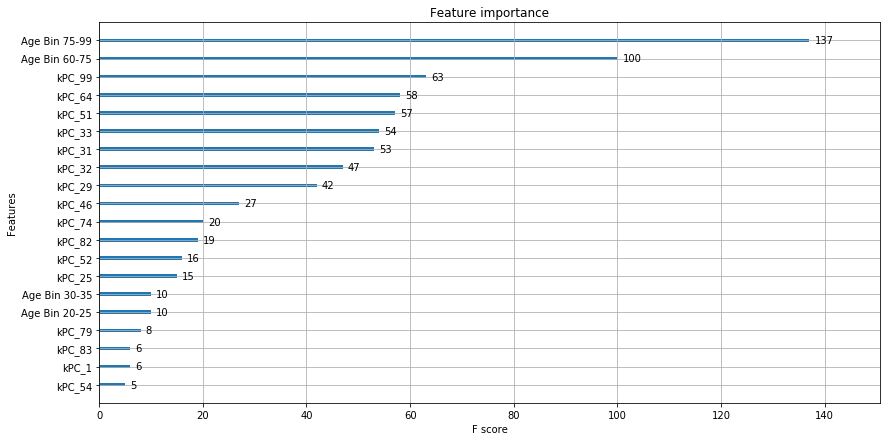

In [153]:
# Plot feature importance
plt.rcParams["figure.figsize"] = (14, 7)
xgb.plot_importance(xbc, max_num_features=20)
plt.show();

### Visualize results

In [154]:
# Adapted from: Hands-On Machine learning with Scikit-Learn and TensorFlow
def plot_precision_recall_vs_threshold(precisions, recalls, thresholds): 
    plt.figure(figsize=(8, 8))
    plt.title("Precision and Recall Scores as a function of the decision␣threshold")
    plt.plot(thresholds, precisions[:-1], "b--", label="Precision")
    plt.plot(thresholds, recalls[:-1], "g-", label="Recall") 
    plt.ylabel("Score")
    plt.xlabel("Decision Threshold")
    plt.legend(loc='best')

In [155]:
!pip install scikit-plot --quiet  #download and instal scikitplot for AUC visualisations
import scikitplot as skplt

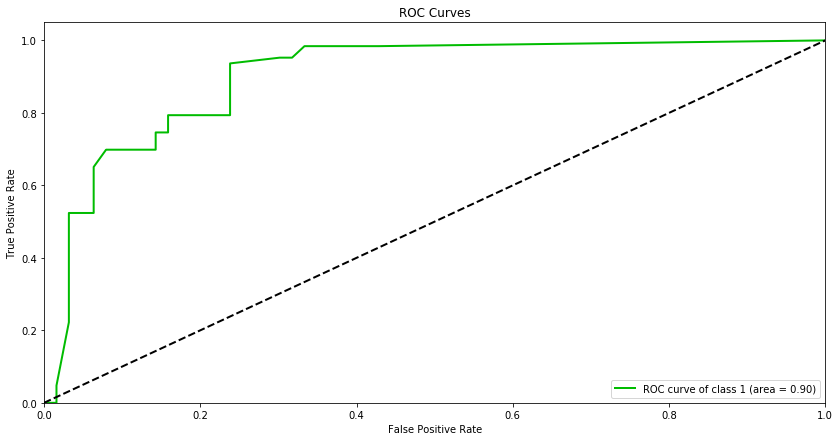

In [156]:
#ROC Curve 
skplt.metrics.plot_roc(y_test, y_pred
                       ,plot_micro=False,plot_macro=False, classes_to_plot=1)
plt.show();


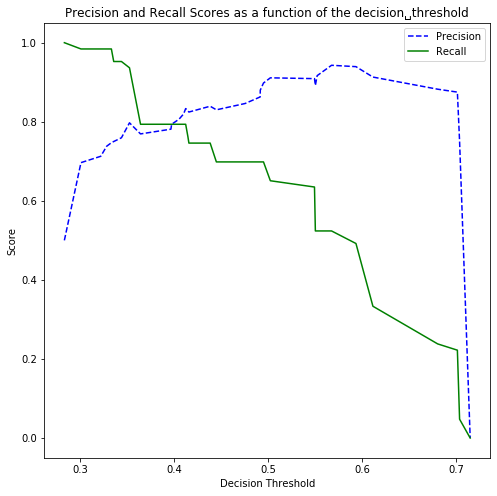

In [157]:
#precision-recall score based on different threshold for predicted probability
p, r, thresholds = precision_recall_curve(y_test, xbc.predict_proba(region_pca_age_bins_perc_test)[:,1])
plot_precision_recall_vs_threshold(p, r, thresholds)
plt.show();

			   Recall Score:  0.94


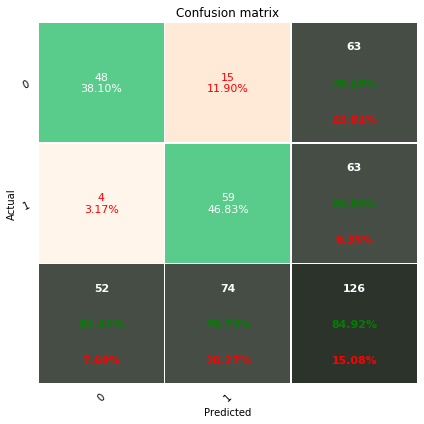

In [158]:
#Set a custom threshold
#With threshold 0.107 we predict all succesful artists correct (recall=1) but we have also 15 FP (False Positive) artists
#A worse AUC would lead to more FP
y_pred_cm =(xbc.predict_proba(region_pca_age_bins_perc_test)[:,1] >= 0.35).astype(bool) #----!-----# HERE MODIFY THE DECISION THRESHOLD
print("\t\t\t   Recall Score: ", round(recall_score(y_test,y_pred_cm),2))
ppcm.plot_confusion_matrix_from_data(y_test2,y_pred_cm, columns=[0,1] ,pred_val_axis='col');
plt.show();

### The presentantion of the results of this notebook can be found in the document Predictive Analytics Group Project.pdf